# Resumen de la solución

## Aviso: la solución supone que las imágenes están en el directorio de trabajo, en una carpeta llamada images. Aunque bueno, como ya está todo ejecutado, no haría falta volver a ejecutar para ver los resultados.

### Lo que he hecho es aplicar una red U-Net para hacer la segmentación de las imágenes. Tal y como se pedía, he adaptado la solución a varias resizes para ver y comparar los resultados (obviamente, con imágenes de entrada mayores el modelo funciona mejor). Además, he hecho dos variaciones de la solución: 
- La primera, más básica, consiste en simplemente alimentar al modelo con las imágenes completas.
- La segunda, algo más elaborada, consiste en, en vez de redimensionar las imágenes, hacer recortes de las imágenes del tamaño deseado. Esto permite además tener un conjunto de datos más amplio, pues de cada imágenes podemos hacer varios recortes de partes diferentes para alimentar el modelo. Además, como en el conjunto de imágenes hay imágenes que tienen trozos en blanco, he evitado coger recortes de imágenes que contengan gran cantidad de espacio en blanco. Además, se hace one hot encoding a las imágenes, para facilitar el tratamiento. Como se verá luego, tanto en cuanto a resultado como en cuanto a rendimiento, esta solución mejora a la anterior.

### Imports

In [1]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.transforms import Compose, ToTensor, Normalize, RandomHorizontalFlip, Resize
from torchvision.transforms import functional as TF

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
from torch.nn.functional import interpolate

from tqdm import tqdm

from sklearn.metrics import jaccard_score

# Propuesta 1: Red U-Net sobre las imágenes originales reescaladas.

### Visualizamos una imagen de cada uno de los splits de las imágenes, para ver qué tipo de imágenes tenemos.

Conteo de imágenes por carpeta: {'train': 137, 'train_labels': 137, 'val': 4, 'val_labels': 4, 'test': 10, 'test_labels': 10}


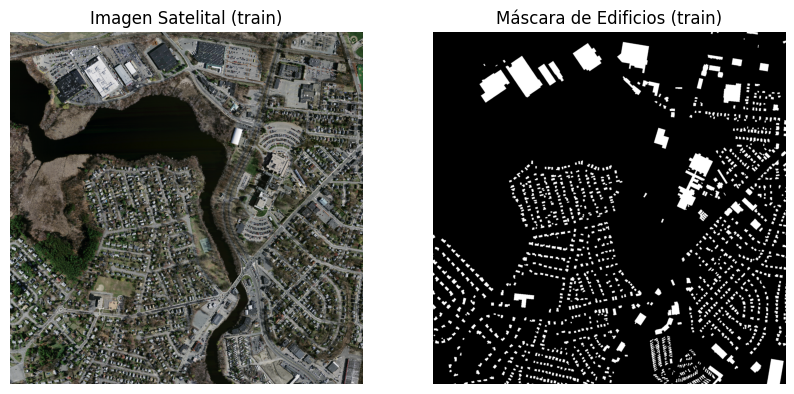

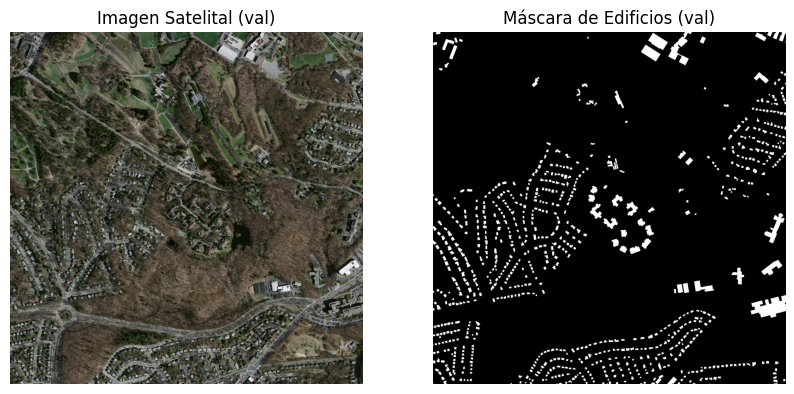

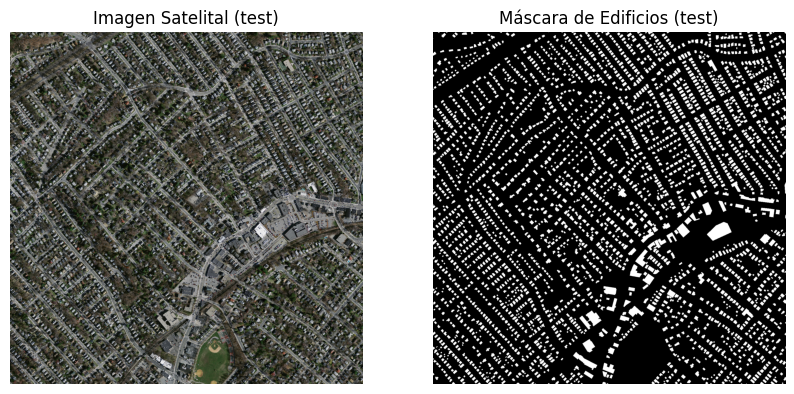

In [2]:
def explore_images(base_path):
    # Definir las categorías de las carpetas que contienen las imágenes y sus etiquetas
    categories = ['train', 'train_labels', 'val', 'val_labels', 'test', 'test_labels']
    image_counts = {}
    
    # Iterar sobre cada categoría para contar los archivos de imagen
    for category in categories:
        # Construir la ruta completa a la carpeta de la categoría
        path = os.path.join(base_path, category)
        # Contar y almacenar el número de archivos en cada categoría
        image_counts[category] = len([name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))])
    
    # Imprimir un resumen del conteo de imágenes por cada carpeta
    print("Conteo de imágenes por carpeta:", image_counts)
    
    # Categorías que contienen imágenes para visualización
    sample_images = ['train', 'val', 'test']
    for category in sample_images:
        # Obtener la lista de archivos de imágenes y etiquetas
        images_list = os.listdir(os.path.join(base_path, category))
        labels_list = os.listdir(os.path.join(base_path, f"{category}_labels"))
        
        # Comprobar si las listas de imágenes y etiquetas no están vacías
        if images_list and labels_list:
            # Seleccionar la primera imagen y etiqueta de las listas para visualización
            image_path = os.path.join(base_path, category, images_list[0])
            label_path = os.path.join(base_path, f"{category}_labels", labels_list[0])
            
            # Abrir la imagen y la etiqueta con Pillow
            image = Image.open(image_path)
            label = Image.open(label_path)
            
            # Configurar el entorno de visualización con Matplotlib
            fig, ax = plt.subplots(1, 2, figsize=(10, 5))
            ax[0].imshow(image)
            ax[0].set_title(f'Imagen Satelital ({category})')
            ax[0].axis('off')
            
            ax[1].imshow(label, cmap='gray')
            ax[1].set_title(f'Máscara de Edificios ({category})')
            ax[1].axis('off')
            
            # Mostrar las imágenes y las etiquetas
            plt.show()

# Obtener el directorio actual y usarlo para llamar a la función
current_directory = os.getcwd()
explore_images(os.path.join(current_directory, 'images'))

### Carga de las imágenes, generando un dataset y un dataloader que luego pasaremos al modelo.

In [3]:
class SatelliteBuildingDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform_image=None, transform_mask=None):
        """
        Inicializa la clase SatelliteBuildingDataset con directorios específicos para imágenes y máscaras,
        y con transformaciones opcionales que se pueden aplicar tanto a las imágenes como a las máscaras.

        Args:
            image_dir (string): Directorio que contiene todas las imágenes.
            mask_dir (string): Directorio que contiene todas las máscaras.
            transform_image (callable, optional): Función de transformación opcional para aplicar a las imágenes.
            transform_mask (callable, optional): Función de transformación opcional para aplicar a las máscaras.
        """
        # Asignar a las variables de la instancia los valores de los parámetros
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform_image = transform_image
        self.transform_mask = transform_mask
        # Listar todos los archivos en el directorio de imágenes. Se asume que cada imagen tiene su correspondiente máscara.
        self.images = os.listdir(image_dir)

    def __len__(self):
        # Devuelve el número total de imágenes en el conjunto de datos
        return len(self.images)

    def __getitem__(self, idx):
        # Construir las rutas completas para la imagen y la máscara usando el índice proporcionado
        img_name = os.path.join(self.image_dir, self.images[idx])
        mask_name = os.path.join(self.mask_dir, self.images[idx])
        
        # Abrir la imagen y convertirla a color RGB
        image = Image.open(img_name).convert("RGB")
        # Abrir la máscara y convertirla a escala de grises para que tenga un solo canal
        mask = Image.open(mask_name).convert("L")  

        # Aplicar las transformaciones especificadas a la imagen y a la máscara, si se han proporcionado
        if self.transform_image:
            image = self.transform_image(image)
        if self.transform_mask:
            mask = self.transform_mask(mask)

        # Devolver la imagen y la máscara procesadas
        return image, mask

In [4]:
def create_dataloaders(base_path, resize, batch_size=4):
    """
    Crea y devuelve dataloaders para los conjuntos de datos de entrenamiento y validación.
    
    Args:
        base_path (str): Ruta base donde se encuentran las carpetas de datos.
        resize (tuple): Dimensiones a las que se redimensionarán todas las imágenes y máscaras.
        batch_size (int, optional): Número de muestras por lote. El valor por defecto es 4.
    """
    
    # Definir transformaciones para aplicar a las imágenes:
    # - Redimensionar las imágenes al tamaño especificado.
    # - Convertir las imágenes a tensores de PyTorch.
    # - Normalizar las imágenes usando medias y desviaciones estándar especificadas.
    transform_image = Compose([
        Resize(resize),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Definir transformaciones para las máscaras, que incluyen redimensionamiento y conversión a tensor.
    # Las máscaras generalmente no requieren normalización.
    transform_mask = Compose([
        Resize(resize),
        ToTensor()
    ])

    # Construir las rutas completas a los directorios de imágenes y máscaras de entrenamiento y validación
    train_dir = os.path.join(base_path, 'train')
    train_mask_dir = os.path.join(base_path, 'train_labels')
    val_dir = os.path.join(base_path, 'val')
    val_mask_dir = os.path.join(base_path, 'val_labels')
    
    # Crear los conjuntos de datos de entrenamiento y validación usando la clase SatelliteBuildingDataset
    train_dataset = SatelliteBuildingDataset(train_dir, train_mask_dir, transform_image, transform_mask)
    val_dataset = SatelliteBuildingDataset(val_dir, val_mask_dir, transform_image, transform_mask)

    # Crear dataloaders para los conjuntos de datos de entrenamiento y validación.
    # El dataloader de entrenamiento mezcla los datos (shuffle=True) para mejorar el entrenamiento.
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # Devolver los dataloaders de entrenamiento y validación
    return train_loader, val_loader

In [5]:
# Suponiendo que estás ejecutando esto desde el directorio principal de tu proyecto
base_path = os.getcwd()
base_path = os.path.join(base_path, 'images')

### Creamos el modelo, así como la función de pérdida. El modelo es de tipo U-Net, con 4 copas de encoder y otras 4 de decoder.

In [42]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        """
        Bloque de doble convolución que aplica dos capas de convolución con una capa de 
        normalización por lotes y activación ReLU entre ellas.

        Args:
            in_channels (int): Número de canales de entrada.
            out_channels (int): Número de canales de salida.
        """
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)
    
    
class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        """
        Bloque de descenso en U-Net que incluye un DoubleConv seguido por un max pooling 
        para reducir la dimensión espacial.

        Args:
            in_channels (int): Número de canales de entrada.
            out_channels (int): Número de canales de salida después de DoubleConv.
        """
        super(DownBlock, self).__init__()
        self.double_conv = DoubleConv(in_channels, out_channels)
        self.down_sample = nn.MaxPool2d(2)

    def forward(self, x):
        skip_out = self.double_conv(x)
        down_out = self.down_sample(skip_out)
        return (down_out, skip_out)

    
class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, up_sample_mode):
        """
        Bloque de ascenso en U-Net que realiza un upsampling y combina características
        de capas anteriores a través de la operación de concatenación.

        Args:
            in_channels (int): Número total de canales de entrada (suma de canales de salida del bloque anterior y del skip connection).
            out_channels (int): Número de canales de salida.
            up_sample_mode (str): Modo de upsampling, 'conv_transpose' para ConvTranspose2d o 'bilinear' para interpolación bilineal.
        """
        super(UpBlock, self).__init__()
        if up_sample_mode == 'conv_transpose':
            self.up_sample = nn.ConvTranspose2d(in_channels-out_channels, in_channels-out_channels, kernel_size=2, stride=2)        
        elif up_sample_mode == 'bilinear':
            self.up_sample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            raise ValueError("Unsupported `up_sample_mode` (can take one of `conv_transpose` or `bilinear`)")
        self.double_conv = DoubleConv(in_channels, out_channels)

    def forward(self, down_input, skip_input):
        x = self.up_sample(down_input)
        x = torch.cat([x, skip_input], dim=1)
        return self.double_conv(x)

    
class UNet(nn.Module):
    def __init__(self, out_classes=1, up_sample_mode='conv_transpose'):
        """
        Red U-Net para segmentación que incluye caminos de descenso y ascenso con un bottleneck.

        Args:
            out_classes (int): Número de clases de salida (usualmente 1 para máscaras de segmentación binaria).
            up_sample_mode (str): Modo de upsampling utilizado en los bloques de ascenso.
        """
        super(UNet, self).__init__()
        self.up_sample_mode = up_sample_mode
        self.down_conv1 = DownBlock(3, 64)
        self.down_conv2 = DownBlock(64, 128)
        self.down_conv3 = DownBlock(128, 256)
        self.down_conv4 = DownBlock(256, 512)
        self.double_conv = DoubleConv(512, 1024)
        self.up_conv4 = UpBlock(512 + 1024, 512, self.up_sample_mode)
        self.up_conv3 = UpBlock(256 + 512, 256, self.up_sample_mode)
        self.up_conv2 = UpBlock(128 + 256, 128, self.up_sample_mode)
        self.up_conv1 = UpBlock(128 + 64, 64, self.up_sample_mode)
        self.conv_last = nn.Conv2d(64, out_classes, kernel_size=1)

    def forward(self, x):
        x, skip1_out = self.down_conv1(x)
        x, skip2_out = self.down_conv2(x)
        x, skip3_out = self.down_conv3(x)
        x, skip4_out = self.down_conv4(x)
        x = self.double_conv(x)
        x = self.up_conv4(x, skip4_out)
        x = self.up_conv3(x, skip3_out)
        x = self.up_conv2(x, skip2_out)
        x = self.up_conv1(x, skip1_out)
        x = self.conv_last(x)
        return x


class DiceLoss(nn.Module):
    def __init__(self, smooth=1.):
        """
        Implementación de la pérdida Dice, útil para comparar la similitud entre dos muestras.

        Args:
            smooth (float): Valor para evitar la división por cero y suavizar el resultado.
        """
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.sigmoid(inputs)  # Convertir logits a probabilidades
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()                            
        dice = (2. * intersection + self.smooth) / (inputs.sum() + targets.sum() + self.smooth)  
        
        return 1 - dice

In [7]:
# Carga el modelo
model = UNet()
# Verifica si CUDA está disponible y mueve el modelo al dispositivo apropiado
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Función de pérdida y el optimizador
criterion = DiceLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [8]:
#Comprobación de que funciona bien
# Crear un tensor de entrada y moverlo al mismo dispositivo
input_tensor = torch.rand((1, 3, 256, 256)).to(device)

# Realizar la predicción
output_mask = model(input_tensor)
print(output_mask.shape)  # Debería tener la forma [1, 1, 256, 256], que corresponde a la máscara predicha

torch.Size([1, 1, 256, 256])


### Añadimos el IoU como métrica para ver cómo progresa y rinde el modelo. La métrica de entrenamiento es Dice, pero es bueno tener más de una métrica en caso de ser posible.

In [9]:
def calculate_iou(outputs, masks):
    """
    Calcula el promedio de la métrica Intersección sobre Unión (IoU) entre las salidas del modelo y las máscaras verdaderas.

    Args:
        outputs: Salidas del modelo (logits).
        masks: Máscaras verdaderas (ground truth).

    Returns:
        Un valor flotante que representa el IoU promedio.
    """
    outputs = torch.sigmoid(outputs) > 0.5  # Convertir logits a predicciones binarias
    outputs = outputs.cpu().numpy().astype(np.uint8)  # Convertir a NumPy para cálculo
    masks = masks.cpu().numpy().astype(np.uint8)
    
    # Calcular IoU para cada par de salida y máscara
    ious = [jaccard_score(m.flatten(), o.flatten()) for m, o in zip(masks, outputs)]
    return np.mean(ious)

def weight_reset(m):
    """
    Reinicia los pesos de las capas convolucionales y lineales a sus valores iniciales.

    Args:
        m: Módulo de PyTorch (capa).
    """
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        m.reset_parameters()

### Bucle de Entrenamiento

Training model with image size: (224, 224)


Epoch 1/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Epoch 1/150, Train Loss: 0.7158, Val Loss: 0.7137, Average IoU: 0.0920
Model saved to saved_models\model_224x224.pth


Epoch 2/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Epoch 2/150, Train Loss: 0.6710, Val Loss: 0.6626, Average IoU: 0.0718
Model saved to saved_models\model_224x224.pth


Epoch 3/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 3/150, Train Loss: 0.6429, Val Loss: 0.6424, Average IoU: 0.0772
Model saved to saved_models\model_224x224.pth


Epoch 4/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 4/150, Train Loss: 0.6284, Val Loss: 0.6271, Average IoU: 0.0747
Model saved to saved_models\model_224x224.pth


Epoch 5/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Epoch 5/150, Train Loss: 0.6135, Val Loss: 0.6090, Average IoU: 0.0847
Model saved to saved_models\model_224x224.pth


Epoch 6/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 6/150, Train Loss: 0.5999, Val Loss: 0.5958, Average IoU: 0.0889
Model saved to saved_models\model_224x224.pth


Epoch 7/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Epoch 7/150, Train Loss: 0.5974, Val Loss: 0.6012, Average IoU: 0.0757


Epoch 8/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 8/150, Train Loss: 0.5896, Val Loss: 0.5685, Average IoU: 0.0890
Model saved to saved_models\model_224x224.pth


Epoch 9/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 9/150, Train Loss: 0.5709, Val Loss: 0.5679, Average IoU: 0.0886
Model saved to saved_models\model_224x224.pth


Epoch 10/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 10/150, Train Loss: 0.5618, Val Loss: 0.5379, Average IoU: 0.1109
Model saved to saved_models\model_224x224.pth


Epoch 11/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 11/150, Train Loss: 0.5565, Val Loss: 0.5367, Average IoU: 0.0989
Model saved to saved_models\model_224x224.pth


Epoch 12/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 12/150, Train Loss: 0.5499, Val Loss: 0.5281, Average IoU: 0.1004
Model saved to saved_models\model_224x224.pth


Epoch 13/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 13/150, Train Loss: 0.5384, Val Loss: 0.5445, Average IoU: 0.0922


Epoch 14/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 14/150, Train Loss: 0.5289, Val Loss: 0.5242, Average IoU: 0.0957
Model saved to saved_models\model_224x224.pth


Epoch 15/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


Epoch 15/150, Train Loss: 0.5378, Val Loss: 0.5145, Average IoU: 0.0943
Model saved to saved_models\model_224x224.pth


Epoch 16/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Epoch 16/150, Train Loss: 0.5226, Val Loss: 0.4998, Average IoU: 0.1020
Model saved to saved_models\model_224x224.pth


Epoch 17/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 17/150, Train Loss: 0.5065, Val Loss: 0.4981, Average IoU: 0.1046
Model saved to saved_models\model_224x224.pth


Epoch 18/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 18/150, Train Loss: 0.5075, Val Loss: 0.4869, Average IoU: 0.1082
Model saved to saved_models\model_224x224.pth


Epoch 19/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Epoch 19/150, Train Loss: 0.4981, Val Loss: 0.4794, Average IoU: 0.1187
Model saved to saved_models\model_224x224.pth


Epoch 20/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 20/150, Train Loss: 0.4890, Val Loss: 0.4813, Average IoU: 0.1064


Epoch 21/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


Epoch 21/150, Train Loss: 0.4877, Val Loss: 0.4724, Average IoU: 0.1111
Model saved to saved_models\model_224x224.pth


Epoch 22/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 22/150, Train Loss: 0.4726, Val Loss: 0.4736, Average IoU: 0.1071


Epoch 23/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 23/150, Train Loss: 0.4697, Val Loss: 0.4809, Average IoU: 0.1053


Epoch 24/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 24/150, Train Loss: 0.4661, Val Loss: 0.4682, Average IoU: 0.1077
Model saved to saved_models\model_224x224.pth


Epoch 25/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 25/150, Train Loss: 0.4633, Val Loss: 0.4591, Average IoU: 0.1125
Model saved to saved_models\model_224x224.pth


Epoch 26/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Epoch 26/150, Train Loss: 0.4505, Val Loss: 0.4573, Average IoU: 0.1100
Model saved to saved_models\model_224x224.pth


Epoch 27/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Epoch 27/150, Train Loss: 0.4468, Val Loss: 0.4551, Average IoU: 0.1133
Model saved to saved_models\model_224x224.pth


Epoch 28/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 28/150, Train Loss: 0.4432, Val Loss: 0.4454, Average IoU: 0.1163
Model saved to saved_models\model_224x224.pth


Epoch 29/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Epoch 29/150, Train Loss: 0.4363, Val Loss: 0.4498, Average IoU: 0.1055


Epoch 30/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Epoch 30/150, Train Loss: 0.4266, Val Loss: 0.4905, Average IoU: 0.1009


Epoch 31/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Epoch 31/150, Train Loss: 0.4306, Val Loss: 0.4596, Average IoU: 0.0993


Epoch 32/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Epoch 32/150, Train Loss: 0.4183, Val Loss: 0.4791, Average IoU: 0.1024


Epoch 33/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 33/150, Train Loss: 0.4061, Val Loss: 0.4568, Average IoU: 0.1037


Epoch 34/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Epoch 34/150, Train Loss: 0.4094, Val Loss: 0.4600, Average IoU: 0.1064


Epoch 35/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Epoch 35/150, Train Loss: 0.4089, Val Loss: 0.4397, Average IoU: 0.1175
Model saved to saved_models\model_224x224.pth


Epoch 36/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Epoch 36/150, Train Loss: 0.4247, Val Loss: 0.4461, Average IoU: 0.1062


Epoch 37/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Epoch 37/150, Train Loss: 0.4024, Val Loss: 0.4811, Average IoU: 0.0893


Epoch 38/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Epoch 38/150, Train Loss: 0.3968, Val Loss: 0.4337, Average IoU: 0.1136
Model saved to saved_models\model_224x224.pth


Epoch 39/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Epoch 39/150, Train Loss: 0.3924, Val Loss: 0.4497, Average IoU: 0.1042


Epoch 40/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Epoch 40/150, Train Loss: 0.4069, Val Loss: 0.4585, Average IoU: 0.0974


Epoch 41/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


Epoch 41/150, Train Loss: 0.3988, Val Loss: 0.4430, Average IoU: 0.1091


Epoch 42/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Epoch 42/150, Train Loss: 0.3827, Val Loss: 0.4390, Average IoU: 0.1145


Epoch 43/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Epoch 43/150, Train Loss: 0.3804, Val Loss: 0.4493, Average IoU: 0.1061


Epoch 44/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Epoch 44/150, Train Loss: 0.3774, Val Loss: 0.4547, Average IoU: 0.1058


Epoch 45/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Epoch 45/150, Train Loss: 0.3718, Val Loss: 0.4399, Average IoU: 0.1018


Epoch 46/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Epoch 46/150, Train Loss: 0.3746, Val Loss: 0.4333, Average IoU: 0.1070
Model saved to saved_models\model_224x224.pth


Epoch 47/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


Epoch 47/150, Train Loss: 0.3744, Val Loss: 0.4411, Average IoU: 0.1102


Epoch 48/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Epoch 48/150, Train Loss: 0.3637, Val Loss: 0.4589, Average IoU: 0.0998


Epoch 49/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 49/150, Train Loss: 0.3607, Val Loss: 0.4572, Average IoU: 0.1097


Epoch 50/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Epoch 50/150, Train Loss: 0.3579, Val Loss: 0.4716, Average IoU: 0.1018


Epoch 51/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


Epoch 51/150, Train Loss: 0.3700, Val Loss: 0.4344, Average IoU: 0.1101


Epoch 52/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 52/150, Train Loss: 0.3561, Val Loss: 0.4333, Average IoU: 0.1042


Epoch 53/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 53/150, Train Loss: 0.3540, Val Loss: 0.4283, Average IoU: 0.1106
Model saved to saved_models\model_224x224.pth


Epoch 54/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Epoch 54/150, Train Loss: 0.3460, Val Loss: 0.4393, Average IoU: 0.1032


Epoch 55/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 55/150, Train Loss: 0.3431, Val Loss: 0.4419, Average IoU: 0.1107


Epoch 56/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 56/150, Train Loss: 0.3486, Val Loss: 0.4406, Average IoU: 0.1057


Epoch 57/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 57/150, Train Loss: 0.3418, Val Loss: 0.4399, Average IoU: 0.1003


Epoch 58/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 58/150, Train Loss: 0.3478, Val Loss: 0.4344, Average IoU: 0.1061


Epoch 59/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 59/150, Train Loss: 0.3436, Val Loss: 0.4392, Average IoU: 0.1027


Epoch 60/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 60/150, Train Loss: 0.3329, Val Loss: 0.4295, Average IoU: 0.1113


Epoch 61/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 61/150, Train Loss: 0.3373, Val Loss: 0.4166, Average IoU: 0.1117
Model saved to saved_models\model_224x224.pth


Epoch 62/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 62/150, Train Loss: 0.3372, Val Loss: 0.4421, Average IoU: 0.1036


Epoch 63/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 63/150, Train Loss: 0.3353, Val Loss: 0.4531, Average IoU: 0.1017


Epoch 64/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Epoch 64/150, Train Loss: 0.3346, Val Loss: 0.4696, Average IoU: 0.1044


Epoch 65/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 65/150, Train Loss: 0.3325, Val Loss: 0.4278, Average IoU: 0.1063


Epoch 66/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Epoch 66/150, Train Loss: 0.3277, Val Loss: 0.4278, Average IoU: 0.1113


Epoch 67/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 67/150, Train Loss: 0.3321, Val Loss: 0.4353, Average IoU: 0.1058


Epoch 68/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 68/150, Train Loss: 0.3323, Val Loss: 0.4514, Average IoU: 0.0939


Epoch 69/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 69/150, Train Loss: 0.3316, Val Loss: 0.4402, Average IoU: 0.1060


Epoch 70/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 70/150, Train Loss: 0.3260, Val Loss: 0.4494, Average IoU: 0.1083


Epoch 71/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 71/150, Train Loss: 0.3267, Val Loss: 0.4239, Average IoU: 0.1136


Epoch 72/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 72/150, Train Loss: 0.3274, Val Loss: 0.4808, Average IoU: 0.0904


Epoch 73/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 73/150, Train Loss: 0.3354, Val Loss: 0.4241, Average IoU: 0.1172


Epoch 74/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 74/150, Train Loss: 0.3312, Val Loss: 0.4671, Average IoU: 0.0938


Epoch 75/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 75/150, Train Loss: 0.3301, Val Loss: 0.4514, Average IoU: 0.0987


Epoch 76/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Epoch 76/150, Train Loss: 0.3298, Val Loss: 0.4517, Average IoU: 0.0947


Epoch 77/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 77/150, Train Loss: 0.3238, Val Loss: 0.4566, Average IoU: 0.0997


Epoch 78/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 78/150, Train Loss: 0.3209, Val Loss: 0.4544, Average IoU: 0.1054


Epoch 79/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 79/150, Train Loss: 0.3186, Val Loss: 0.4512, Average IoU: 0.1053


Epoch 80/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Epoch 80/150, Train Loss: 0.3181, Val Loss: 0.4387, Average IoU: 0.1073


Epoch 81/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 81/150, Train Loss: 0.3224, Val Loss: 0.4374, Average IoU: 0.1003


Epoch 82/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 82/150, Train Loss: 0.3180, Val Loss: 0.4338, Average IoU: 0.1131


Epoch 83/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 83/150, Train Loss: 0.3397, Val Loss: 0.4543, Average IoU: 0.0990


Epoch 84/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 84/150, Train Loss: 0.3244, Val Loss: 0.4168, Average IoU: 0.1118


Epoch 85/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Epoch 85/150, Train Loss: 0.3127, Val Loss: 0.4423, Average IoU: 0.1028


Epoch 86/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Epoch 86/150, Train Loss: 0.3149, Val Loss: 0.4365, Average IoU: 0.1131


Epoch 87/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 87/150, Train Loss: 0.3134, Val Loss: 0.4304, Average IoU: 0.1057


Epoch 88/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Epoch 88/150, Train Loss: 0.3126, Val Loss: 0.4300, Average IoU: 0.1059


Epoch 89/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Epoch 89/150, Train Loss: 0.3135, Val Loss: 0.4453, Average IoU: 0.1006


Epoch 90/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Epoch 90/150, Train Loss: 0.3135, Val Loss: 0.4406, Average IoU: 0.0990


Epoch 91/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 91/150, Train Loss: 0.3098, Val Loss: 0.4499, Average IoU: 0.0996


Epoch 92/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 92/150, Train Loss: 0.3135, Val Loss: 0.4462, Average IoU: 0.1062


Epoch 93/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Epoch 93/150, Train Loss: 0.3120, Val Loss: 0.4332, Average IoU: 0.1140


Epoch 94/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Epoch 94/150, Train Loss: 0.3101, Val Loss: 0.4440, Average IoU: 0.1068


Epoch 95/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Epoch 95/150, Train Loss: 0.3178, Val Loss: 0.4415, Average IoU: 0.1036


Epoch 96/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


Epoch 96/150, Train Loss: 0.3259, Val Loss: 0.4661, Average IoU: 0.1025


Epoch 97/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 97/150, Train Loss: 0.3123, Val Loss: 0.4290, Average IoU: 0.1081


Epoch 98/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Epoch 98/150, Train Loss: 0.3136, Val Loss: 0.4716, Average IoU: 0.1013


Epoch 99/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 99/150, Train Loss: 0.3068, Val Loss: 0.4395, Average IoU: 0.1032


Epoch 100/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 100/150, Train Loss: 0.3087, Val Loss: 0.4438, Average IoU: 0.1094


Epoch 101/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Epoch 101/150, Train Loss: 0.3104, Val Loss: 0.4329, Average IoU: 0.1059


Epoch 102/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Epoch 102/150, Train Loss: 0.3058, Val Loss: 0.4419, Average IoU: 0.1029


Epoch 103/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 103/150, Train Loss: 0.3103, Val Loss: 0.4769, Average IoU: 0.0949


Epoch 104/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 104/150, Train Loss: 0.3111, Val Loss: 0.4351, Average IoU: 0.1070


Epoch 105/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 105/150, Train Loss: 0.3053, Val Loss: 0.4366, Average IoU: 0.1053


Epoch 106/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 106/150, Train Loss: 0.3073, Val Loss: 0.4596, Average IoU: 0.1039


Epoch 107/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 107/150, Train Loss: 0.3039, Val Loss: 0.4334, Average IoU: 0.1022


Epoch 108/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 108/150, Train Loss: 0.3038, Val Loss: 0.4263, Average IoU: 0.1101


Epoch 109/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 109/150, Train Loss: 0.3005, Val Loss: 0.4378, Average IoU: 0.1058


Epoch 110/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 110/150, Train Loss: 0.2982, Val Loss: 0.4282, Average IoU: 0.1094


Epoch 111/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 111/150, Train Loss: 0.3019, Val Loss: 0.4411, Average IoU: 0.1052


Epoch 112/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Epoch 112/150, Train Loss: 0.2980, Val Loss: 0.4574, Average IoU: 0.0994


Epoch 113/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 113/150, Train Loss: 0.2967, Val Loss: 0.4403, Average IoU: 0.1109


Epoch 114/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Epoch 114/150, Train Loss: 0.3017, Val Loss: 0.4325, Average IoU: 0.1071


Epoch 115/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 115/150, Train Loss: 0.3002, Val Loss: 0.4359, Average IoU: 0.1053


Epoch 116/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 116/150, Train Loss: 0.3002, Val Loss: 0.4452, Average IoU: 0.1023


Epoch 117/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 117/150, Train Loss: 0.2977, Val Loss: 0.4263, Average IoU: 0.1064


Epoch 118/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 118/150, Train Loss: 0.3019, Val Loss: 0.4356, Average IoU: 0.1119


Epoch 119/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Epoch 119/150, Train Loss: 0.3047, Val Loss: 0.4501, Average IoU: 0.1008


Epoch 120/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Epoch 120/150, Train Loss: 0.3034, Val Loss: 0.4303, Average IoU: 0.1072


Epoch 121/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Epoch 121/150, Train Loss: 0.3015, Val Loss: 0.4905, Average IoU: 0.1017


Epoch 122/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Epoch 122/150, Train Loss: 0.3003, Val Loss: 0.4419, Average IoU: 0.1071


Epoch 123/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Epoch 123/150, Train Loss: 0.3061, Val Loss: 0.4500, Average IoU: 0.1038


Epoch 124/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Epoch 124/150, Train Loss: 0.3082, Val Loss: 0.4401, Average IoU: 0.1109


Epoch 125/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Epoch 125/150, Train Loss: 0.2974, Val Loss: 0.4291, Average IoU: 0.1117


Epoch 126/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Epoch 126/150, Train Loss: 0.3013, Val Loss: 0.4332, Average IoU: 0.1058


Epoch 127/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Epoch 127/150, Train Loss: 0.3030, Val Loss: 0.4382, Average IoU: 0.1101


Epoch 128/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 128/150, Train Loss: 0.2981, Val Loss: 0.4279, Average IoU: 0.1079


Epoch 129/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 129/150, Train Loss: 0.3020, Val Loss: 0.4317, Average IoU: 0.1124


Epoch 130/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 130/150, Train Loss: 0.2989, Val Loss: 0.4369, Average IoU: 0.1057


Epoch 131/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 131/150, Train Loss: 0.2977, Val Loss: 0.4492, Average IoU: 0.1062


Epoch 132/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Epoch 132/150, Train Loss: 0.3020, Val Loss: 0.4423, Average IoU: 0.1079


Epoch 133/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 133/150, Train Loss: 0.2944, Val Loss: 0.4307, Average IoU: 0.1091


Epoch 134/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 134/150, Train Loss: 0.3067, Val Loss: 0.4298, Average IoU: 0.1059


Epoch 135/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 135/150, Train Loss: 0.3017, Val Loss: 0.4679, Average IoU: 0.1053


Epoch 136/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 136/150, Train Loss: 0.2967, Val Loss: 0.4335, Average IoU: 0.1104


Epoch 137/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Epoch 137/150, Train Loss: 0.2937, Val Loss: 0.4350, Average IoU: 0.1077


Epoch 138/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Epoch 138/150, Train Loss: 0.3003, Val Loss: 0.4309, Average IoU: 0.1102


Epoch 139/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Epoch 139/150, Train Loss: 0.3047, Val Loss: 0.4317, Average IoU: 0.1067


Epoch 140/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Epoch 140/150, Train Loss: 0.2945, Val Loss: 0.4237, Average IoU: 0.1109


Epoch 141/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 141/150, Train Loss: 0.2967, Val Loss: 0.4418, Average IoU: 0.1058


Epoch 142/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 142/150, Train Loss: 0.2938, Val Loss: 0.4401, Average IoU: 0.1097


Epoch 143/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Epoch 143/150, Train Loss: 0.2934, Val Loss: 0.4364, Average IoU: 0.1097


Epoch 144/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Epoch 144/150, Train Loss: 0.2964, Val Loss: 0.4309, Average IoU: 0.1117


Epoch 145/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 145/150, Train Loss: 0.2900, Val Loss: 0.4373, Average IoU: 0.1063


Epoch 146/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Epoch 146/150, Train Loss: 0.2939, Val Loss: 0.4366, Average IoU: 0.1038


Epoch 147/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Epoch 147/150, Train Loss: 0.2953, Val Loss: 0.4444, Average IoU: 0.1096


Epoch 148/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Epoch 148/150, Train Loss: 0.2911, Val Loss: 0.4346, Average IoU: 0.1028


Epoch 149/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Epoch 149/150, Train Loss: 0.2964, Val Loss: 0.4584, Average IoU: 0.1036


Epoch 150/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Epoch 150/150, Train Loss: 0.2969, Val Loss: 0.4228, Average IoU: 0.1086


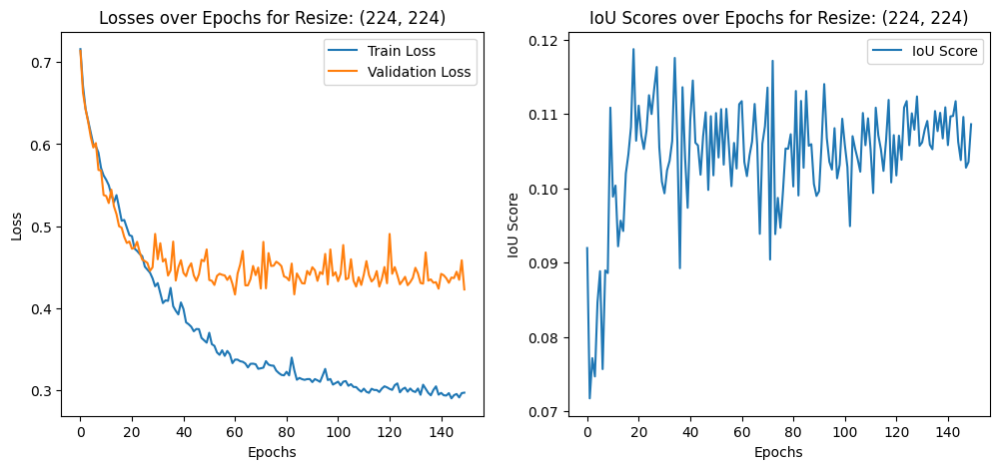

Training model with image size: (448, 448)


Epoch 1/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 1/150, Train Loss: 0.6557, Val Loss: 0.5620, Average IoU: 0.1489


Epoch 2/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 2/150, Train Loss: 0.5778, Val Loss: 0.6575, Average IoU: 0.0825


Epoch 3/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 3/150, Train Loss: 0.5302, Val Loss: 0.4924, Average IoU: 0.1808


Epoch 4/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Epoch 4/150, Train Loss: 0.4944, Val Loss: 0.4740, Average IoU: 0.1823


Epoch 5/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 5/150, Train Loss: 0.4735, Val Loss: 0.4368, Average IoU: 0.2102


Epoch 6/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 6/150, Train Loss: 0.4445, Val Loss: 0.4058, Average IoU: 0.2138
Model saved to saved_models\model_448x448.pth


Epoch 7/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 7/150, Train Loss: 0.4297, Val Loss: 0.3988, Average IoU: 0.2243
Model saved to saved_models\model_448x448.pth


Epoch 8/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 8/150, Train Loss: 0.4248, Val Loss: 0.3802, Average IoU: 0.2277
Model saved to saved_models\model_448x448.pth


Epoch 9/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 9/150, Train Loss: 0.4143, Val Loss: 0.3801, Average IoU: 0.2227
Model saved to saved_models\model_448x448.pth


Epoch 10/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 10/150, Train Loss: 0.3978, Val Loss: 0.4373, Average IoU: 0.1922


Epoch 11/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 11/150, Train Loss: 0.3943, Val Loss: 0.3594, Average IoU: 0.2440
Model saved to saved_models\model_448x448.pth


Epoch 12/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 12/150, Train Loss: 0.3816, Val Loss: 0.3613, Average IoU: 0.2316


Epoch 13/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 13/150, Train Loss: 0.3978, Val Loss: 0.4191, Average IoU: 0.1958


Epoch 14/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 14/150, Train Loss: 0.3967, Val Loss: 0.3553, Average IoU: 0.2323
Model saved to saved_models\model_448x448.pth


Epoch 15/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 15/150, Train Loss: 0.3808, Val Loss: 0.3688, Average IoU: 0.2216


Epoch 16/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 16/150, Train Loss: 0.3693, Val Loss: 0.3438, Average IoU: 0.2489
Model saved to saved_models\model_448x448.pth


Epoch 17/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 17/150, Train Loss: 0.3621, Val Loss: 0.3374, Average IoU: 0.2350
Model saved to saved_models\model_448x448.pth


Epoch 18/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 18/150, Train Loss: 0.3579, Val Loss: 0.3556, Average IoU: 0.2141


Epoch 19/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 19/150, Train Loss: 0.3648, Val Loss: 0.3844, Average IoU: 0.2052


Epoch 20/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 20/150, Train Loss: 0.3522, Val Loss: 0.3425, Average IoU: 0.2291


Epoch 21/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 21/150, Train Loss: 0.3543, Val Loss: 0.3579, Average IoU: 0.2528


Epoch 22/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 22/150, Train Loss: 0.3397, Val Loss: 0.3353, Average IoU: 0.2386
Model saved to saved_models\model_448x448.pth


Epoch 23/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 23/150, Train Loss: 0.3360, Val Loss: 0.3292, Average IoU: 0.2488
Model saved to saved_models\model_448x448.pth


Epoch 24/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 24/150, Train Loss: 0.3410, Val Loss: 0.3277, Average IoU: 0.2311
Model saved to saved_models\model_448x448.pth


Epoch 25/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 25/150, Train Loss: 0.3363, Val Loss: 0.3183, Average IoU: 0.2667
Model saved to saved_models\model_448x448.pth


Epoch 26/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 26/150, Train Loss: 0.3315, Val Loss: 0.3186, Average IoU: 0.2549


Epoch 27/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 27/150, Train Loss: 0.3381, Val Loss: 0.3303, Average IoU: 0.2467


Epoch 28/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 28/150, Train Loss: 0.3265, Val Loss: 0.3241, Average IoU: 0.2481


Epoch 29/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 29/150, Train Loss: 0.3177, Val Loss: 0.3223, Average IoU: 0.2379


Epoch 30/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 30/150, Train Loss: 0.3180, Val Loss: 0.3227, Average IoU: 0.2456


Epoch 31/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Epoch 31/150, Train Loss: 0.3151, Val Loss: 0.3156, Average IoU: 0.2431
Model saved to saved_models\model_448x448.pth


Epoch 32/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 32/150, Train Loss: 0.3353, Val Loss: 0.3526, Average IoU: 0.2384


Epoch 33/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 33/150, Train Loss: 0.3161, Val Loss: 0.3296, Average IoU: 0.2522


Epoch 34/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 34/150, Train Loss: 0.3195, Val Loss: 0.3193, Average IoU: 0.2493


Epoch 35/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 35/150, Train Loss: 0.3184, Val Loss: 0.3299, Average IoU: 0.2444


Epoch 36/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 36/150, Train Loss: 0.3132, Val Loss: 0.3240, Average IoU: 0.2404


Epoch 37/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 37/150, Train Loss: 0.2983, Val Loss: 0.3029, Average IoU: 0.2611
Model saved to saved_models\model_448x448.pth


Epoch 38/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 38/150, Train Loss: 0.3046, Val Loss: 0.3133, Average IoU: 0.2483


Epoch 39/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 39/150, Train Loss: 0.2992, Val Loss: 0.3147, Average IoU: 0.2487


Epoch 40/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 40/150, Train Loss: 0.2968, Val Loss: 0.3134, Average IoU: 0.2531


Epoch 41/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 41/150, Train Loss: 0.2888, Val Loss: 0.3001, Average IoU: 0.2628
Model saved to saved_models\model_448x448.pth


Epoch 42/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 42/150, Train Loss: 0.2932, Val Loss: 0.3203, Average IoU: 0.2434


Epoch 43/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 43/150, Train Loss: 0.2921, Val Loss: 0.3067, Average IoU: 0.2478


Epoch 44/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 44/150, Train Loss: 0.2923, Val Loss: 0.3130, Average IoU: 0.2565


Epoch 45/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 45/150, Train Loss: 0.2865, Val Loss: 0.3127, Average IoU: 0.2405


Epoch 46/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 46/150, Train Loss: 0.2935, Val Loss: 0.3156, Average IoU: 0.2431


Epoch 47/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 47/150, Train Loss: 0.2971, Val Loss: 0.3067, Average IoU: 0.2554


Epoch 48/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 48/150, Train Loss: 0.2853, Val Loss: 0.3088, Average IoU: 0.2555


Epoch 49/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 49/150, Train Loss: 0.2854, Val Loss: 0.3095, Average IoU: 0.2647


Epoch 50/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Epoch 50/150, Train Loss: 0.2864, Val Loss: 0.3633, Average IoU: 0.2078


Epoch 51/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 51/150, Train Loss: 0.3024, Val Loss: 0.3206, Average IoU: 0.2706


Epoch 52/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 52/150, Train Loss: 0.3084, Val Loss: 0.3291, Average IoU: 0.2462


Epoch 53/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 53/150, Train Loss: 0.2912, Val Loss: 0.3152, Average IoU: 0.2354


Epoch 54/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 54/150, Train Loss: 0.2852, Val Loss: 0.3018, Average IoU: 0.2603


Epoch 55/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 55/150, Train Loss: 0.2845, Val Loss: 0.3471, Average IoU: 0.2421


Epoch 56/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 56/150, Train Loss: 0.2892, Val Loss: 0.3079, Average IoU: 0.2593


Epoch 57/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 57/150, Train Loss: 0.2742, Val Loss: 0.3090, Average IoU: 0.2614


Epoch 58/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 58/150, Train Loss: 0.2684, Val Loss: 0.3149, Average IoU: 0.2428


Epoch 59/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Epoch 59/150, Train Loss: 0.2690, Val Loss: 0.3233, Average IoU: 0.2501


Epoch 60/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 60/150, Train Loss: 0.2681, Val Loss: 0.3179, Average IoU: 0.2533


Epoch 61/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 61/150, Train Loss: 0.2702, Val Loss: 0.3221, Average IoU: 0.2484


Epoch 62/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 62/150, Train Loss: 0.2771, Val Loss: 0.3010, Average IoU: 0.2653


Epoch 63/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 63/150, Train Loss: 0.2704, Val Loss: 0.3078, Average IoU: 0.2655


Epoch 64/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 64/150, Train Loss: 0.2656, Val Loss: 0.3194, Average IoU: 0.2423


Epoch 65/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 65/150, Train Loss: 0.2594, Val Loss: 0.3087, Average IoU: 0.2498


Epoch 66/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 66/150, Train Loss: 0.2588, Val Loss: 0.3179, Average IoU: 0.2405


Epoch 67/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Epoch 67/150, Train Loss: 0.2551, Val Loss: 0.3130, Average IoU: 0.2410


Epoch 68/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 68/150, Train Loss: 0.2574, Val Loss: 0.3057, Average IoU: 0.2502


Epoch 69/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 69/150, Train Loss: 0.2621, Val Loss: 0.3151, Average IoU: 0.2479


Epoch 70/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 70/150, Train Loss: 0.2641, Val Loss: 0.3192, Average IoU: 0.2423


Epoch 71/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 71/150, Train Loss: 0.2567, Val Loss: 0.3178, Average IoU: 0.2487


Epoch 72/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 72/150, Train Loss: 0.2524, Val Loss: 0.3229, Average IoU: 0.2473


Epoch 73/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 73/150, Train Loss: 0.2504, Val Loss: 0.3178, Average IoU: 0.2423


Epoch 74/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 74/150, Train Loss: 0.2521, Val Loss: 0.3212, Average IoU: 0.2435


Epoch 75/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 75/150, Train Loss: 0.2489, Val Loss: 0.3128, Average IoU: 0.2398


Epoch 76/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 76/150, Train Loss: 0.2477, Val Loss: 0.3326, Average IoU: 0.2417


Epoch 77/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 77/150, Train Loss: 0.2488, Val Loss: 0.3183, Average IoU: 0.2419


Epoch 78/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 78/150, Train Loss: 0.2510, Val Loss: 0.3079, Average IoU: 0.2481


Epoch 79/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 79/150, Train Loss: 0.2483, Val Loss: 0.3106, Average IoU: 0.2467


Epoch 80/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 80/150, Train Loss: 0.2479, Val Loss: 0.3161, Average IoU: 0.2487


Epoch 81/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 81/150, Train Loss: 0.2450, Val Loss: 0.3327, Average IoU: 0.2302


Epoch 82/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 82/150, Train Loss: 0.2762, Val Loss: 0.3147, Average IoU: 0.2556


Epoch 83/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 83/150, Train Loss: 0.2728, Val Loss: 0.3112, Average IoU: 0.2569


Epoch 84/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 84/150, Train Loss: 0.2540, Val Loss: 0.3291, Average IoU: 0.2383


Epoch 85/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 85/150, Train Loss: 0.2511, Val Loss: 0.3089, Average IoU: 0.2439


Epoch 86/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 86/150, Train Loss: 0.2480, Val Loss: 0.3092, Average IoU: 0.2567


Epoch 87/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 87/150, Train Loss: 0.2412, Val Loss: 0.3195, Average IoU: 0.2399


Epoch 88/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 88/150, Train Loss: 0.2426, Val Loss: 0.3239, Average IoU: 0.2465


Epoch 89/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 89/150, Train Loss: 0.2423, Val Loss: 0.3216, Average IoU: 0.2483


Epoch 90/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 90/150, Train Loss: 0.2401, Val Loss: 0.3229, Average IoU: 0.2296


Epoch 91/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 91/150, Train Loss: 0.2377, Val Loss: 0.3159, Average IoU: 0.2501


Epoch 92/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 92/150, Train Loss: 0.2386, Val Loss: 0.3147, Average IoU: 0.2510


Epoch 93/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 93/150, Train Loss: 0.2591, Val Loss: 0.3166, Average IoU: 0.2322


Epoch 94/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 94/150, Train Loss: 0.2433, Val Loss: 0.3138, Average IoU: 0.2491


Epoch 95/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 95/150, Train Loss: 0.2381, Val Loss: 0.3322, Average IoU: 0.2265


Epoch 96/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 96/150, Train Loss: 0.2361, Val Loss: 0.3123, Average IoU: 0.2595


Epoch 97/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 97/150, Train Loss: 0.2343, Val Loss: 0.3138, Average IoU: 0.2541


Epoch 98/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Epoch 98/150, Train Loss: 0.2325, Val Loss: 0.3181, Average IoU: 0.2455


Epoch 99/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 99/150, Train Loss: 0.2301, Val Loss: 0.3187, Average IoU: 0.2394


Epoch 100/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 100/150, Train Loss: 0.2373, Val Loss: 0.3162, Average IoU: 0.2366


Epoch 101/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 101/150, Train Loss: 0.2321, Val Loss: 0.3173, Average IoU: 0.2541


Epoch 102/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 102/150, Train Loss: 0.2321, Val Loss: 0.3236, Average IoU: 0.2411


Epoch 103/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 103/150, Train Loss: 0.2309, Val Loss: 0.3138, Average IoU: 0.2539


Epoch 104/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 104/150, Train Loss: 0.2284, Val Loss: 0.3272, Average IoU: 0.2489


Epoch 105/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 105/150, Train Loss: 0.2260, Val Loss: 0.3211, Average IoU: 0.2564


Epoch 106/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 106/150, Train Loss: 0.2351, Val Loss: 0.3296, Average IoU: 0.2271


Epoch 107/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 107/150, Train Loss: 0.2285, Val Loss: 0.3197, Average IoU: 0.2463


Epoch 108/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 108/150, Train Loss: 0.2238, Val Loss: 0.3174, Average IoU: 0.2361


Epoch 109/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 109/150, Train Loss: 0.2359, Val Loss: 0.3342, Average IoU: 0.2510


Epoch 110/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 110/150, Train Loss: 0.2319, Val Loss: 0.3204, Average IoU: 0.2606


Epoch 111/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Epoch 111/150, Train Loss: 0.2224, Val Loss: 0.3182, Average IoU: 0.2442


Epoch 112/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 112/150, Train Loss: 0.2278, Val Loss: 0.3196, Average IoU: 0.2487


Epoch 113/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 113/150, Train Loss: 0.2193, Val Loss: 0.3261, Average IoU: 0.2461


Epoch 114/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 114/150, Train Loss: 0.2180, Val Loss: 0.3200, Average IoU: 0.2445


Epoch 115/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 115/150, Train Loss: 0.2202, Val Loss: 0.3284, Average IoU: 0.2471


Epoch 116/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 116/150, Train Loss: 0.2209, Val Loss: 0.3215, Average IoU: 0.2588


Epoch 117/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 117/150, Train Loss: 0.2229, Val Loss: 0.3293, Average IoU: 0.2404


Epoch 118/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 118/150, Train Loss: 0.2167, Val Loss: 0.3248, Average IoU: 0.2554


Epoch 119/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 119/150, Train Loss: 0.2194, Val Loss: 0.3265, Average IoU: 0.2441


Epoch 120/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 120/150, Train Loss: 0.2238, Val Loss: 0.3192, Average IoU: 0.2442


Epoch 121/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 121/150, Train Loss: 0.2256, Val Loss: 0.3497, Average IoU: 0.2320


Epoch 122/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 122/150, Train Loss: 0.2690, Val Loss: 0.3115, Average IoU: 0.2546


Epoch 123/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 123/150, Train Loss: 0.2877, Val Loss: 0.3427, Average IoU: 0.2266


Epoch 124/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 124/150, Train Loss: 0.2479, Val Loss: 0.3191, Average IoU: 0.2380


Epoch 125/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 125/150, Train Loss: 0.2362, Val Loss: 0.3090, Average IoU: 0.2558


Epoch 126/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 126/150, Train Loss: 0.2279, Val Loss: 0.3255, Average IoU: 0.2517


Epoch 127/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Epoch 127/150, Train Loss: 0.2326, Val Loss: 0.3158, Average IoU: 0.2703


Epoch 128/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Epoch 128/150, Train Loss: 0.2262, Val Loss: 0.3223, Average IoU: 0.2462


Epoch 129/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Epoch 129/150, Train Loss: 0.2225, Val Loss: 0.3334, Average IoU: 0.2405


Epoch 130/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Epoch 130/150, Train Loss: 0.2194, Val Loss: 0.3097, Average IoU: 0.2477


Epoch 131/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Epoch 131/150, Train Loss: 0.2237, Val Loss: 0.3316, Average IoU: 0.2410


Epoch 132/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Epoch 132/150, Train Loss: 0.2189, Val Loss: 0.3154, Average IoU: 0.2412


Epoch 133/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 133/150, Train Loss: 0.2135, Val Loss: 0.3242, Average IoU: 0.2555


Epoch 134/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 134/150, Train Loss: 0.2144, Val Loss: 0.3168, Average IoU: 0.2431


Epoch 135/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 135/150, Train Loss: 0.2156, Val Loss: 0.3259, Average IoU: 0.2392


Epoch 136/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Epoch 136/150, Train Loss: 0.2162, Val Loss: 0.3291, Average IoU: 0.2456


Epoch 137/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 137/150, Train Loss: 0.2110, Val Loss: 0.3218, Average IoU: 0.2507


Epoch 138/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 138/150, Train Loss: 0.2122, Val Loss: 0.3291, Average IoU: 0.2324


Epoch 139/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Epoch 139/150, Train Loss: 0.2103, Val Loss: 0.3211, Average IoU: 0.2428


Epoch 140/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 140/150, Train Loss: 0.2144, Val Loss: 0.3217, Average IoU: 0.2443


Epoch 141/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Epoch 141/150, Train Loss: 0.2102, Val Loss: 0.3274, Average IoU: 0.2497


Epoch 142/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 142/150, Train Loss: 0.2105, Val Loss: 0.3224, Average IoU: 0.2489


Epoch 143/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 143/150, Train Loss: 0.2140, Val Loss: 0.3399, Average IoU: 0.2402


Epoch 144/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


Epoch 144/150, Train Loss: 0.2188, Val Loss: 0.3231, Average IoU: 0.2541


Epoch 145/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Epoch 145/150, Train Loss: 0.2138, Val Loss: 0.3209, Average IoU: 0.2448


Epoch 146/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 146/150, Train Loss: 0.2112, Val Loss: 0.3228, Average IoU: 0.2542


Epoch 147/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 147/150, Train Loss: 0.2267, Val Loss: 0.3272, Average IoU: 0.2373


Epoch 148/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Epoch 148/150, Train Loss: 0.2155, Val Loss: 0.3125, Average IoU: 0.2491


Epoch 149/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Epoch 149/150, Train Loss: 0.2189, Val Loss: 0.3294, Average IoU: 0.2446


Epoch 150/150 Validation: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Epoch 150/150, Train Loss: 0.2086, Val Loss: 0.3325, Average IoU: 0.2307


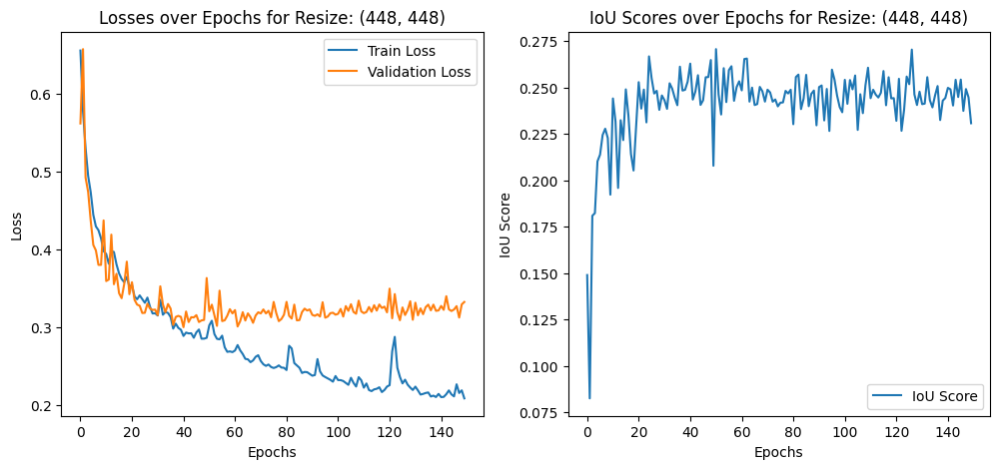

In [10]:
sizes = [(224, 224), (448, 448)]  # Tamaños de entrada para probar
num_epochs = 150  # Número de épocas para el entrenamiento
base_path = os.getcwd()  # Obtener la ruta base del proyecto
base_path = os.path.join(base_path, 'images')  # Ruta a las imágenes
best_loss = float('inf')  # Inicializar la mejor pérdida como infinito

for resize in sizes:
    print(f"Training model with image size: {resize}")
    train_loader, val_loader = create_dataloaders(base_path, resize, batch_size=4)  # Crear dataloaders para entrenamiento y validación

    # Inicializar listas para almacenar pérdidas y puntuaciones IoU
    train_losses = []
    val_losses = []
    iou_scores = []

    for epoch in range(num_epochs):
        model.train()  # Poner el modelo en modo entrenamiento
        running_loss = 0.0
        train_tqdm = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} Training', leave=True)
        for images, masks in train_tqdm:
            images, masks = images.to(device), masks.to(device)
            
            optimizer.zero_grad()  # Resetear gradientes del optimizador
            outputs = model(images)  # Pasar imágenes por el modelo
            loss = criterion(outputs, masks)  # Calcular pérdida
            loss.backward()  # Retropropagación de errores
            optimizer.step()  # Actualizar pesos
            
            running_loss += loss.item() * images.size(0)  # Acumular pérdida escalada por el tamaño del lote
            train_tqdm.set_postfix(loss=(running_loss / (train_tqdm.last_print_n + 1)))  # Actualizar información en tqdm
        
        epoch_loss = running_loss / len(train_loader.dataset)  # Calcular pérdida promedio de la época
        train_losses.append(epoch_loss)

        # Proceso de validación para evaluar el modelo
        model.eval()  # Poner el modelo en modo evaluación
        val_running_loss = 0.0
        ious = []
        val_tqdm = tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} Validation', leave=True)
        with torch.no_grad():  # Desactivar cálculo de gradientes para la validación
            for images, masks in val_tqdm:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_running_loss += loss.item() * images.size(0)
                
                iou = calculate_iou(outputs, masks)  # Calcular IoU
                ious.append(iou)
        
        val_epoch_loss = val_running_loss / len(val_loader.dataset)  # Pérdida promedio de validación
        average_iou = np.mean(ious)  # IoU promedio
        val_losses.append(val_epoch_loss)
        iou_scores.append(average_iou)
        
        # Imprimir estadísticas del entrenamiento y validación
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Average IoU: {iou_scores[-1]:.4f}')

        # Guardar el modelo si la pérdida de validación es la más baja hasta el momento
        if val_epoch_loss < best_loss:
            model_save_path = os.path.join('saved_models', f'model_{resize[0]}x{resize[1]}.pth')
            os.makedirs('saved_models', exist_ok=True)
            torch.save(model.state_dict(), model_save_path)
            print(f"Model saved to {model_save_path}")
            best_loss = val_epoch_loss

    # Visualizar gráficos de pérdidas y IoU
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title(f'Losses over Epochs for Resize: {resize}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(iou_scores, label='IoU Score')
    plt.title(f'IoU Scores over Epochs for Resize: {resize}')
    plt.xlabel('Epochs')
    plt.ylabel('IoU Score')
    plt.legend()
    plt.show()

    model.apply(weight_reset)  # Reiniciar pesos del modelo para la siguiente configuración de tamaño

### Por último, evaluamos el modelo en test. Además de las métricas, creo que es útil ver algunos ejemplos donde se vea la imagen original, la máscara verdadera y la máscara predicha.

In [43]:
def create_test_dataloader(base_path, batch_size, resize):
    """
    Crea un DataLoader para el conjunto de datos de prueba.

    Args:
        base_path (str): Ruta base donde están almacenadas las imágenes y las máscaras.
        batch_size (int): Tamaño del lote.
        resize (tuple): Dimensiones a las que se redimensionarán las imágenes y máscaras.

    Returns:
        DataLoader: Objeto DataLoader configurado para el conjunto de datos de prueba.
    """
    # Transformaciones aplicadas a las imágenes
    transform_image = Compose([
        Resize(resize),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Transformaciones aplicadas a las máscaras (sólo redimensionamiento y conversión a tensor)
    transform_mask = Compose([
        Resize(resize),
        ToTensor()
    ])
    
    # Crear dataset usando los directorios especificados
    test_dir = os.path.join(base_path, 'test')
    test_mask_dir = os.path.join(base_path, 'test_labels')
    test_dataset = SatelliteBuildingDataset(test_dir, test_mask_dir, transform_image, transform_mask)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return test_loader

def plot_examples(data_loader, model, device, num_examples=5):
    """
    Muestra ejemplos de imágenes, sus máscaras verdaderas y las predicciones del modelo.

    Args:
        data_loader (DataLoader): DataLoader que contiene el conjunto de datos de prueba.
        model (nn.Module): Modelo de red neuronal para generar las predicciones.
        device (torch.device): Dispositivo donde se ejecuta el modelo (CPU o GPU).
        num_examples (int): Número de ejemplos a visualizar.
    """
    fig, axs = plt.subplots(num_examples, 3, figsize=(15, num_examples * 5))
    model.eval()

    for idx, (images, masks) in enumerate(data_loader):
        if idx >= num_examples:
            break
        images, masks = images.to(device), masks.to(device)
        with torch.no_grad():
            outputs = model(images)
            preds = torch.sigmoid(outputs) > 0.5

        # Visualizar la imagen original, la máscara verdadera y la máscara predicha
        axs[idx, 0].imshow(images[0].cpu().permute(1, 2, 0))
        axs[idx, 0].set_title('Original Image')
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(masks[0].cpu().squeeze(), cmap='gray')
        axs[idx, 1].set_title('True Mask')
        axs[idx, 1].axis('off')

        axs[idx, 2].imshow(preds[0].cpu().squeeze(), cmap='gray')
        axs[idx, 2].set_title('Predicted Mask')
        axs[idx, 2].axis('off')

    plt.show()

Mean IoU for size (224, 224): 0.1218


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


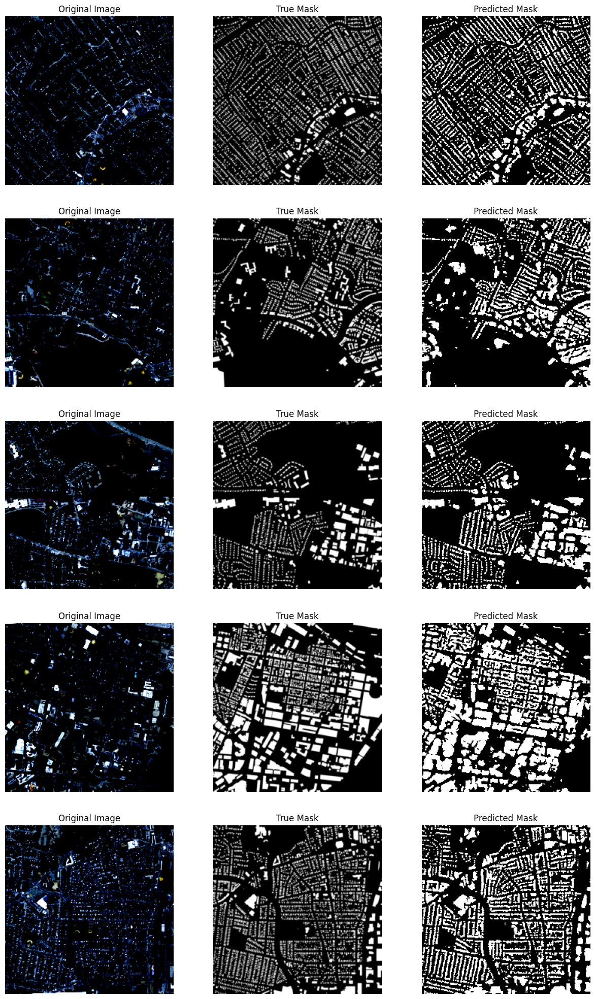

Mean IoU for size (448, 448): 0.3089


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


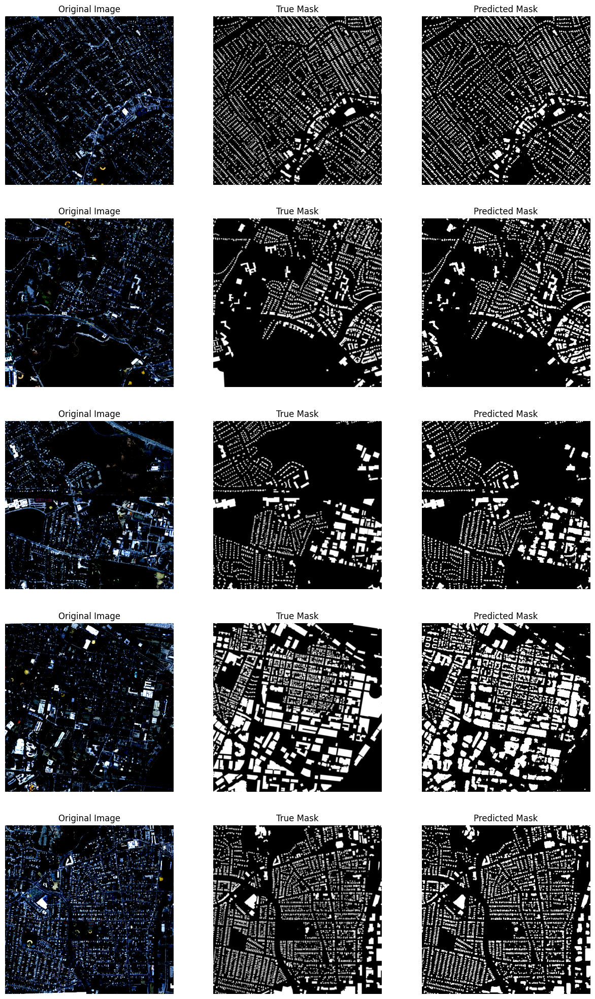

In [44]:
batch_size = 1

for resize in sizes:
    model_path = f'saved_models/model_{resize[0]}x{resize[1]}.pth'
    test_loader = create_test_dataloader(base_path, batch_size, resize)
    
    model = UNet()  # Asumir que el modelo ha sido definido previamente
    model.load_state_dict(torch.load(model_path))
    model.to(device)
    model.eval()
    
    iou_scores = []  # Lista para almacenar los puntajes IoU

    for images, true_masks in test_loader:
        images = images.to(device)
        true_masks = true_masks.to(device)

        with torch.no_grad():
            outputs = model(images)
            preds = torch.sigmoid(outputs) > 0.5  # Umbralizar para obtener máscaras binarias

        preds_np = preds.cpu().numpy().astype(np.uint8)
        true_masks_np = true_masks.cpu().numpy().astype(np.uint8)

        # Calcular y almacenar el puntaje IoU para cada imagen en el lote
        for pred, true_mask in zip(preds_np, true_masks_np):
            iou_score = jaccard_score(true_mask.flatten(), pred.flatten())
            iou_scores.append(iou_score)

    mean_iou = np.mean(iou_scores)  # Calcular el IoU medio para el tamaño actual
    print(f'Mean IoU for size {resize}: {mean_iou:.4f}')
    plot_examples(test_loader, model, device, num_examples=5)  # Visualizar ejemplos de predicciones

# Propuesta 2: Recortar las imágenes en trocitos más pequeños y así entrenar con más imágenes (son las mismas imágenes en realidad, pero tomamos trocitos de las mismas, lo que en la práctica hace que tengamos más material para entrenar).

### El proceso es el mismo que antes, aunque hay que ajustar la mayoría de funciones para que puedan funcionar con los nuevos parámetros de las imágenes.

In [30]:
class RandomCropTransform:
    def __init__(self, output_size):
        """
        Inicializa la transformación de recorte aleatorio con un tamaño de salida especificado.

        Args:
            output_size (int): Tamaño del lado del cuadrado de salida para el recorte.
        """
        self.output_size = output_size

    def __call__(self, image, mask):
        # Verificar que las dimensiones de la imagen y la máscara son mayores que el tamaño de salida deseado
        assert image.size[0] >= self.output_size and image.size[1] >= self.output_size
        
        white_threshold = 0.1  # Establecer un umbral para la cantidad máxima de píxeles blancos permitidos en el recorte
        max_attempts = 100  # Limitar el número de intentos para encontrar un recorte adecuado

        for _ in range(max_attempts):
            i = random.randint(0, image.size[0] - self.output_size)
            j = random.randint(0, image.size[1] - self.output_size)

            cropped_image = TF.crop(image, i, j, self.output_size, self.output_size)
            cropped_mask = TF.crop(mask, i, j, self.output_size, self.output_size)

            # Convertir el recorte de la imagen a un array y contar píxeles blancos
            image_array = np.array(cropped_image)
            num_white_pixels = np.sum(np.all(image_array == [255, 255, 255], axis=-1))
            total_pixels = self.output_size * self.output_size
            if num_white_pixels / total_pixels < white_threshold:
                break  # Si el recorte cumple con el umbral, terminar el bucle
                
        # Aplicar transformaciones aleatorias adicionales
        if random.random() > 0.5:
            cropped_image, cropped_mask = TF.hflip(cropped_image), TF.hflip(cropped_mask)
        if random.random() > 0.5:
            cropped_image, cropped_mask = TF.vflip(cropped_image), TF.vflip(cropped_mask)
        if random.random() > 0.5:
            angle = 90
            cropped_image, cropped_mask = TF.rotate(cropped_image, angle), TF.rotate(cropped_mask, angle)

        return cropped_image, cropped_mask

class SatelliteDataset_onehot(Dataset):
    def __init__(self, image_dir, mask_dir, output_size, transform=None, resize=True):
        """
        Inicializa el conjunto de datos satelitales con capacidades para transformar imágenes y máscaras.

        Args:
            image_dir (str): Directorio con las imágenes.
            mask_dir (str): Directorio con las máscaras.
            output_size (int): Tamaño del lado del cuadrado de salida para el recorte.
            transform (callable, optional): Transformaciones a aplicar a las máscaras.
            resize (bool): Si se debe aplicar el recorte y redimensionamiento.
        """
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.images = [img for img in os.listdir(image_dir) if img.endswith('.png')]
        self.transform = transform
        self.crop_transform = RandomCropTransform(output_size)
        self.resize = resize
        self.output_size = output_size
        self.resize_transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        img_path = os.path.join(self.image_dir, self.images[index])
        mask_path = os.path.join(self.mask_dir, self.images[index])
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        
        # Si resize está activo, aplicar transformaciones de recorte y redimensionamiento
        if self.resize:
            image, mask = self.crop_transform(image, mask)
            image = self.resize_transform(image)
            mask = self.transform(mask)
        else:
            image = self.transform(image)
            mask = self.transform(mask)
        
        return image, mask

In [31]:
class ToOneHot:
    def __init__(self, n_classes=2):
        """
        Inicializa un transformador que convierte máscaras a representación one-hot.

        Args:
            n_classes (int): Número de clases distintas en la máscara, incluyendo el fondo.
        """
        self.n_classes = n_classes

    def __call__(self, mask):
        """
        Aplica la transformación a una máscara.

        Args:
            mask (PIL Image or ndarray): Máscara de entrada.

        Returns:
            Tensor: Máscara en formato one-hot como tensor de PyTorch.
        """
        # Convertir la máscara a array de numpy y ajustar los valores a 0 o 1
        mask_array = np.array(mask)
        mask_array = np.where(mask_array == 255, 1, 0)  # Convertir 255 a 1, manteniendo 0 como está
        # Convertir la máscara ajustada a tensor
        mask_tensor = torch.as_tensor(mask_array, dtype=torch.int64)
        # Aplicar one_hot
        one_hot = torch.nn.functional.one_hot(mask_tensor, num_classes=self.n_classes).permute(2, 0, 1).float()
        return one_hot

def create_dataloaders_onehot(base_path, resize, batch_size=4):
    """
    Crea dataloaders para entrenamiento y validación con transformaciones específicas, incluyendo one-hot para las máscaras.

    Args:
        base_path (str): Ruta base donde se encuentran los directorios de imágenes y máscaras.
        resize (int): Tamaño al que se redimensionarán las imágenes y máscaras.
        batch_size (int): Número de elementos en cada lote de datos.

    Returns:
        tuple: Dos DataLoader, uno para entrenamiento y otro para validación.
    """
    # Transformaciones para las imágenes
    transform_image = transforms.Compose([
        transforms.Resize(1344),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    transform_mask_train = transforms.Compose([
        transforms.Resize(resize),
        ToOneHot(),
        # transforms.ToTensor()
    ])

    transform_mask_val = transforms.Compose([
        transforms.Resize(1344),
        ToOneHot(),
        # transforms.ToTensor()
    ])
    
    # Directorios de datos
    train_dir = os.path.join(base_path, 'train')
    train_mask_dir = os.path.join(base_path, 'train_labels')
    val_dir = os.path.join(base_path, 'val')
    val_mask_dir = os.path.join(base_path, 'val_labels')
    
    # Creación de datasets y dataloaders
    train_dataset = SatelliteDataset_onehot(train_dir, train_mask_dir, output_size=resize, transform=transform_mask_train, resize=True)
    val_dataset = SatelliteBuildingDataset(val_dir, val_mask_dir, transform_image, transform_mask_val)
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader

# Configuración inicial
base_path = os.getcwd()
base_path = os.path.join(base_path, 'images')

# Crear dataloaders para un tamaño de salida especificado
output_size = 224
train_loader, val_loader = create_dataloaders_onehot(base_path, output_size)

Image shape: torch.Size([3, 224, 224]) Mask shape: torch.Size([2, 224, 224])
Image shape: torch.Size([3, 224, 224]) Mask shape: torch.Size([2, 224, 224])
Image shape: torch.Size([3, 224, 224]) Mask shape: torch.Size([2, 224, 224])
Image shape: torch.Size([3, 224, 224]) Mask shape: torch.Size([2, 224, 224])


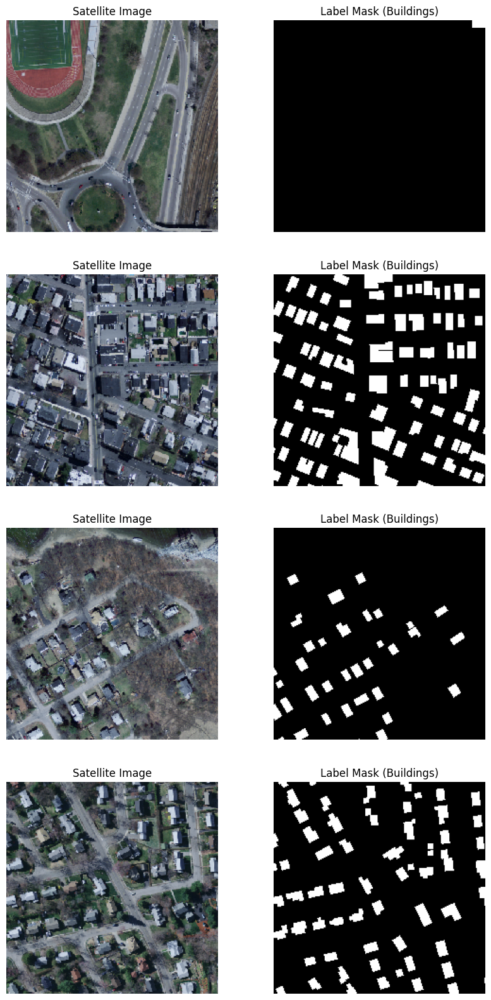

In [32]:
def show_images(images, masks, num_images=4):
    """
    Muestra un conjunto de imágenes y máscaras.

    Args:
        images (Tensor): Tensor de imágenes con dimensiones [batch_size, channels, height, width].
        masks (Tensor): Tensor de máscaras con dimensiones [batch_size, channels, height, width], 
                        donde cada canal representa una clase diferente.
        num_images (int): Número de imágenes y máscaras a mostrar.
    """
    fig, axs = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))
    for i in range(num_images):
        # Reorganizar los canales de la imagen para la visualización
        img = images[i].permute(1, 2, 0)
        img = img.numpy()
        # Normalizar la imagen para mejorar la visualización
        img = (img - img.min()) / (img.max() - img.min())
        
        # Seleccionar el canal correspondiente a la clase de interés, por ejemplo, edificios
        mask = masks[i][1]  # Suponiendo que el segundo canal representa edificios
        mask = mask.numpy()

        # Imprimir dimensiones para verificar que todo está correcto
        print("Image shape:", images[i].shape, "Mask shape:", masks[i].shape)
        
        axs[i, 0].imshow(img)
        axs[i, 1].imshow(mask, cmap='gray')
        axs[i, 0].set_title('Satellite Image')
        axs[i, 1].set_title('Label Mask (Buildings)')
        axs[i, 0].axis('off')
        axs[i, 1].axis('off')
    plt.show()

# Suponiendo que `train_loader` ya está definido y cargado correctamente
images, masks = next(iter(train_loader))  # Cargar un lote de imágenes y máscaras del DataLoader
show_images(images, masks)  # Llamar a la función para mostrar las imágenes

In [33]:
class UNet(nn.Module):
    def __init__(self, out_classes=2, up_sample_mode='conv_transpose'):
        """
        Inicializa la red U-Net con un camino de descenso y ascenso, incluyendo un bloque final.

        Args:
            out_classes (int): Número de clases de salida para la segmentación.
            up_sample_mode (str): Método de muestreo hacia arriba; 'conv_transpose' o 'bilinear'.
        """
        super(UNet, self).__init__()
        self.up_sample_mode = up_sample_mode
        # Inicialización de los bloques de descenso
        self.down_conv1 = DownBlock(3, 64)
        self.down_conv2 = DownBlock(64, 128)
        self.down_conv3 = DownBlock(128, 256)
        self.down_conv4 = DownBlock(256, 512)
        # Bottleneck
        self.double_conv = DoubleConv(512, 1024)
        # Inicialización de los bloques de ascenso
        self.up_conv4 = UpBlock(512 + 1024, 512, self.up_sample_mode)
        self.up_conv3 = UpBlock(256 + 512, 256, self.up_sample_mode)
        self.up_conv2 = UpBlock(128 + 256, 128, self.up_sample_mode)
        self.up_conv1 = UpBlock(128 + 64, 64, self.up_sample_mode)
        # Capa convolucional final
        self.conv_last = nn.Conv2d(64, out_classes, kernel_size=1)
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        """
        Define el flujo de datos a través de la red, usando los bloques definidos.

        Args:
            x (Tensor): Imagen de entrada.

        Returns:
            Tensor: Salidas de la red con probabilidad de clases.
        """
        x, skip1_out = self.down_conv1(x)
        x, skip2_out = self.down_conv2(x)
        x, skip3_out = self.down_conv3(x)
        x, skip4_out = self.down_conv4(x)
        x = self.double_conv(x)
        x = self.up_conv4(x, skip4_out)
        x = self.up_conv3(x, skip3_out)
        x = self.up_conv2(x, skip2_out)
        x = self.up_conv1(x, skip1_out)
        x = self.conv_last(x)
        x = self.softmax(x)  # Aplicar softmax en la última capa
        return x


In [34]:
def split_image_into_segments(image_tensor, output_size):
    """
    Divide una imagen grande en segmentos más pequeños.

    Args:
        image_tensor (Tensor): Imagen de entrada.
        output_size (int): Tamaño de cada segmento cuadrado.

    Returns:
        list: Lista de segmentos de imagen.
        list: Lista de coordenadas correspondientes a cada segmento.
    """
    _, h, w = image_tensor.shape
    segments = []
    coords = []
    for i in range(0, h, output_size):
        for j in range(0, w, output_size):
            right = min(j + output_size, w)
            lower = min(i + output_size, h)
            segment = image_tensor[:, i:lower, j:right]
            segments.append(segment)
            coords.append((j, i))
    return segments, coords


def predict_and_recombine_segments(segments, coords, model, output_size, image_shape, device):
    """
    Predice y recombina segmentos de una imagen para formar la máscara completa.

    Args:
        segments (list): Segmentos de la imagen.
        coords (list): Coordenadas de cada segmento en la imagen original.
        model (UNet): Modelo de red U-Net.
        output_size (int): Tamaño de cada segmento.
        image_shape (tuple): Dimensiones originales de la imagen.
        device (torch.device): Dispositivo en el que se ejecuta el modelo.

    Returns:
        Tensor: Máscara completa reconstruida.
    """
    full_mask = torch.zeros((2, image_shape[1], image_shape[2]), device=device)
    for segment, (x, y) in zip(segments, coords):
        segment = segment.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(segment)
        full_mask[:, y:y+output_size, x:x+output_size] = output.squeeze(0)
    return full_mask



def calculate_iou(outputs, masks):
    # Interpolar las salidas si es necesario para que coincidan con el tamaño de las máscaras
    if outputs.size()[2:] != masks.size()[2:]:
        outputs = F.interpolate(outputs, size=masks.size()[2:], mode='nearest')

    # Aplica sigmoid y luego umbraliza las salidas para convertirlas en binarias
    outputs = torch.sigmoid(outputs) > 0.5
    outputs = outputs.float()

    # Asegurarse de que ambos tensores están en CPU y convertidos a numpy uint8
    outputs = outputs.cpu().numpy().astype(np.uint8)
    masks = masks.cpu().numpy().astype(np.uint8)

    # Calcula IoU usando jaccard_score con zero_division ajustado
    ious = [jaccard_score(m.flatten(), o.flatten(), zero_division=1) for m, o in zip(masks, outputs)]
    return np.mean(ious)


def validate_model(val_loader, model, output_size, device, criterion):
    """
    Evalúa el modelo en un conjunto de datos de validación.

    Args:
        val_loader (DataLoader): DataLoader que proporciona lotes de imágenes y máscaras.
        model (nn.Module): Modelo de red neuronal para evaluar.
        output_size (int): Tamaño de los segmentos en los que se divide cada imagen.
        device (torch.device): Dispositivo en el que se ejecutan los cálculos (CPU o GPU).
        criterion (loss function): Función de pérdida utilizada para evaluar la exactitud del modelo.

    Returns:
        tuple: Promedio de las pérdidas de validación y promedio de los puntajes IoU.
    """
    model.eval()  # Pone el modelo en modo de evaluación (importante para desactivar dropout, batchnorm, etc.)
    val_losses = []  # Lista para almacenar las pérdidas de cada lote
    iou_scores = []  # Lista para almacenar los puntajes IoU de cada lote

    for images, masks in val_loader:
        images = images.to(device)  # Envía las imágenes al dispositivo adecuado
        masks = masks.to(device)  # Envía las máscaras al dispositivo adecuado

        # Tensor para almacenar las predicciones de todas las imágenes en el lote
        predictions = torch.zeros(masks.size(0), 2, masks.size(2), masks.size(3), device=device)

        # Procesar cada imagen del lote individualmente
        for i, image in enumerate(images):
            # Dividir la imagen en segmentos y obtener las coordenadas de cada segmento
            segments, coords = split_image_into_segments(image.cpu(), output_size)
            # Predecir y reconstruir la máscara completa a partir de los segmentos
            full_mask = predict_and_recombine_segments(segments, coords, model, output_size, image.shape, device)
            predictions[i] = full_mask.to(device)  # Guardar la máscara reconstruida en el tensor de predicciones
        
        # Calcular la pérdida para el lote utilizando la función de pérdida especificada
        loss = criterion(predictions, masks.argmax(dim=1))  # Usar argmax si las máscaras están en formato one-hot
        val_losses.append(loss.item())  # Agregar la pérdida del lote a la lista de pérdidas

        # Calcular el IoU para el lote utilizando la función definida
        iou = calculate_iou(predictions.argmax(dim=1), masks.argmax(dim=1))  # Usar argmax para comparar las clases predichas
        iou_scores.append(iou)  # Agregar el IoU del lote a la lista de IoUs
        
    # Calcular y devolver el promedio de las pérdidas y los IoUs de todos los lotes procesados
    return np.mean(val_losses), np.mean(iou_scores)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

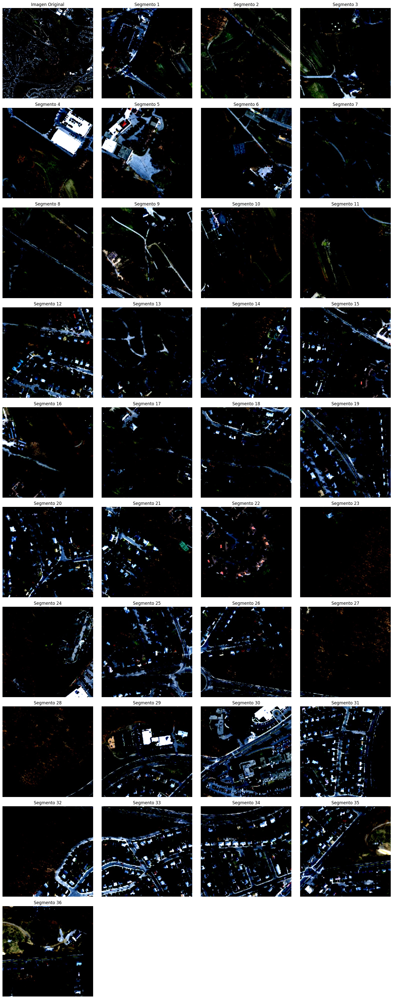

In [35]:
def visualize_image_and_segments(data_loader, output_size):
    """
    Visualiza la primera imagen de un DataLoader y sus segmentos resultantes de un tamaño especificado.

    Args:
        data_loader (DataLoader): DataLoader que proporciona las imágenes y máscaras.
        output_size (int): Tamaño de los segmentos cuadrados en que se dividirá la imagen.
    """
    # Obtener un batch de imágenes y máscaras
    images, masks = next(iter(data_loader))
    image = images[0]  # Tomar la primera imagen del batch
    mask = masks[0]    # Tomar la primera máscara del batch

    # Dividir la imagen en segmentos utilizando la función definida
    segments, coords = split_image_into_segments(image, output_size)

    # Configuración para plotear
    num_segments = len(segments)
    cols = 4  # Número de columnas en el plot
    rows = (num_segments // cols) + 2  # Calcular número de filas en el plot

    plt.figure(figsize=(cols * 4, rows * 4))

    # Mostrar la imagen original en el primer subplot
    plt.subplot(rows, cols, 1)
    plt.imshow(image.permute(1, 2, 0))  # Reordenar de [C, H, W] a [H, W, C]
    plt.title("Imagen Original")
    plt.axis('off')

    # Mostrar cada segmento en subplots adicionales
    for idx, segment in enumerate(segments, start=2):
        plt.subplot(rows, cols, idx)
        plt.imshow(segment.permute(1, 2, 0))  # Reordenar de [C, H, W] a [H, W, C]
        plt.title(f"Segmento {idx-1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Suponer que `val_loader` y `output_size` están correctamente definidos
visualize_image_and_segments(val_loader, output_size=224)

In [36]:
# Carga el modelo
model = UNet()
# Verifica si CUDA está disponible y mueve el modelo al dispositivo apropiado
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Define la función de pérdida y el optimizador
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

Training model with image size: (224, 224)


Epoch 1/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=2.34]


Epoch 1/150, Train Loss: 0.5968, Val Loss: 0.5204, Average IoU: 0.2231
Model saved to saved_models\model_cropped_224x224.pth


Epoch 2/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=2.03]


Epoch 2/150, Train Loss: 0.5197, Val Loss: 0.4721, Average IoU: 0.3042
Model saved to saved_models\model_cropped_224x224.pth


Epoch 3/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.94]


Epoch 3/150, Train Loss: 0.4944, Val Loss: 0.4681, Average IoU: 0.3633
Model saved to saved_models\model_cropped_224x224.pth


Epoch 4/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.88]


Epoch 4/150, Train Loss: 0.4812, Val Loss: 0.4438, Average IoU: 0.3157


Epoch 5/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.82]


Epoch 5/150, Train Loss: 0.4641, Val Loss: 0.4340, Average IoU: 0.3435


Epoch 6/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.8] 


Epoch 6/150, Train Loss: 0.4610, Val Loss: 0.4307, Average IoU: 0.3634
Model saved to saved_models\model_cropped_224x224.pth


Epoch 7/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.78]


Epoch 7/150, Train Loss: 0.4547, Val Loss: 0.4228, Average IoU: 0.3355


Epoch 8/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.73]


Epoch 8/150, Train Loss: 0.4427, Val Loss: 0.4229, Average IoU: 0.3722
Model saved to saved_models\model_cropped_224x224.pth


Epoch 9/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.74]


Epoch 9/150, Train Loss: 0.4439, Val Loss: 0.4204, Average IoU: 0.3983
Model saved to saved_models\model_cropped_224x224.pth


Epoch 10/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.72]


Epoch 10/150, Train Loss: 0.4396, Val Loss: 0.4661, Average IoU: 0.3228


Epoch 11/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.74]


Epoch 11/150, Train Loss: 0.4455, Val Loss: 0.4089, Average IoU: 0.3828


Epoch 12/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.68]


Epoch 12/150, Train Loss: 0.4295, Val Loss: 0.4073, Average IoU: 0.3929


Epoch 13/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.66]


Epoch 13/150, Train Loss: 0.4253, Val Loss: 0.4021, Average IoU: 0.4244
Model saved to saved_models\model_cropped_224x224.pth


Epoch 14/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.66]


Epoch 14/150, Train Loss: 0.4248, Val Loss: 0.4020, Average IoU: 0.4054


Epoch 15/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.63]


Epoch 15/150, Train Loss: 0.4176, Val Loss: 0.3997, Average IoU: 0.3941


Epoch 16/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.66]


Epoch 16/150, Train Loss: 0.4246, Val Loss: 0.3933, Average IoU: 0.4223


Epoch 17/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.66]


Epoch 17/150, Train Loss: 0.4236, Val Loss: 0.3919, Average IoU: 0.4132


Epoch 18/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.61]


Epoch 18/150, Train Loss: 0.4117, Val Loss: 0.4213, Average IoU: 0.4038


Epoch 19/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.62]


Epoch 19/150, Train Loss: 0.4145, Val Loss: 0.3922, Average IoU: 0.3969


Epoch 20/150 Training: 100%|██████████| 35/35 [00:15<00:00,  2.20it/s, loss=1.62]


Epoch 20/150, Train Loss: 0.4130, Val Loss: 0.3920, Average IoU: 0.4043


Epoch 21/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.6] 


Epoch 21/150, Train Loss: 0.4078, Val Loss: 0.3853, Average IoU: 0.4121


Epoch 22/150 Training: 100%|██████████| 35/35 [00:15<00:00,  2.19it/s, loss=1.64]


Epoch 22/150, Train Loss: 0.4182, Val Loss: 0.3850, Average IoU: 0.4288
Model saved to saved_models\model_cropped_224x224.pth


Epoch 23/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.58]


Epoch 23/150, Train Loss: 0.4031, Val Loss: 0.3899, Average IoU: 0.4162


Epoch 24/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.6] 


Epoch 24/150, Train Loss: 0.4088, Val Loss: 0.3856, Average IoU: 0.4379
Model saved to saved_models\model_cropped_224x224.pth


Epoch 25/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.6] 


Epoch 25/150, Train Loss: 0.4089, Val Loss: 0.3811, Average IoU: 0.4150


Epoch 26/150 Training: 100%|██████████| 35/35 [00:15<00:00,  2.20it/s, loss=1.57]


Epoch 26/150, Train Loss: 0.4023, Val Loss: 0.3869, Average IoU: 0.3997


Epoch 27/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.58]


Epoch 27/150, Train Loss: 0.4042, Val Loss: 0.3893, Average IoU: 0.4424
Model saved to saved_models\model_cropped_224x224.pth


Epoch 28/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.59]


Epoch 28/150, Train Loss: 0.4072, Val Loss: 0.3784, Average IoU: 0.4358


Epoch 29/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.59]


Epoch 29/150, Train Loss: 0.4051, Val Loss: 0.3817, Average IoU: 0.4245


Epoch 30/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.57]


Epoch 30/150, Train Loss: 0.4010, Val Loss: 0.3837, Average IoU: 0.4585
Model saved to saved_models\model_cropped_224x224.pth


Epoch 31/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.57]


Epoch 31/150, Train Loss: 0.4013, Val Loss: 0.3795, Average IoU: 0.4509


Epoch 32/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.57]


Epoch 32/150, Train Loss: 0.4000, Val Loss: 0.3853, Average IoU: 0.4488


Epoch 33/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.59]


Epoch 33/150, Train Loss: 0.4051, Val Loss: 0.3816, Average IoU: 0.4129


Epoch 34/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.53]


Epoch 34/150, Train Loss: 0.3897, Val Loss: 0.3778, Average IoU: 0.4222


Epoch 35/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.54]


Epoch 35/150, Train Loss: 0.3928, Val Loss: 0.3759, Average IoU: 0.4631
Model saved to saved_models\model_cropped_224x224.pth


Epoch 36/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.55]


Epoch 36/150, Train Loss: 0.3955, Val Loss: 0.3822, Average IoU: 0.3900


Epoch 37/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.58]


Epoch 37/150, Train Loss: 0.4028, Val Loss: 0.3810, Average IoU: 0.3969


Epoch 38/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.54]


Epoch 38/150, Train Loss: 0.3943, Val Loss: 0.3821, Average IoU: 0.4349


Epoch 39/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.57]


Epoch 39/150, Train Loss: 0.3998, Val Loss: 0.3813, Average IoU: 0.3993


Epoch 40/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.56]


Epoch 40/150, Train Loss: 0.3991, Val Loss: 0.3795, Average IoU: 0.4549


Epoch 41/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.57]


Epoch 41/150, Train Loss: 0.4008, Val Loss: 0.3920, Average IoU: 0.3578


Epoch 42/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.54]


Epoch 42/150, Train Loss: 0.3931, Val Loss: 0.3765, Average IoU: 0.4342


Epoch 43/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.55]


Epoch 43/150, Train Loss: 0.3969, Val Loss: 0.3817, Average IoU: 0.4357


Epoch 44/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.53]


Epoch 44/150, Train Loss: 0.3916, Val Loss: 0.3837, Average IoU: 0.3624


Epoch 45/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.57]


Epoch 45/150, Train Loss: 0.4008, Val Loss: 0.3788, Average IoU: 0.4336


Epoch 46/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.53]


Epoch 46/150, Train Loss: 0.3918, Val Loss: 0.3788, Average IoU: 0.4636
Model saved to saved_models\model_cropped_224x224.pth


Epoch 47/150 Training: 100%|██████████| 35/35 [00:15<00:00,  2.19it/s, loss=1.56]


Epoch 47/150, Train Loss: 0.3975, Val Loss: 0.3768, Average IoU: 0.4386


Epoch 48/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.55]


Epoch 48/150, Train Loss: 0.3957, Val Loss: 0.3822, Average IoU: 0.4589


Epoch 49/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.55]


Epoch 49/150, Train Loss: 0.3951, Val Loss: 0.3783, Average IoU: 0.4042


Epoch 50/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.53]


Epoch 50/150, Train Loss: 0.3905, Val Loss: 0.3757, Average IoU: 0.4575


Epoch 51/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.56]


Epoch 51/150, Train Loss: 0.3994, Val Loss: 0.3780, Average IoU: 0.4313


Epoch 52/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.57]


Epoch 52/150, Train Loss: 0.4016, Val Loss: 0.3770, Average IoU: 0.4485


Epoch 53/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.52]


Epoch 53/150, Train Loss: 0.3890, Val Loss: 0.3745, Average IoU: 0.4718
Model saved to saved_models\model_cropped_224x224.pth


Epoch 54/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.56]


Epoch 54/150, Train Loss: 0.3991, Val Loss: 0.3759, Average IoU: 0.4572


Epoch 55/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.52]


Epoch 55/150, Train Loss: 0.3886, Val Loss: 0.3759, Average IoU: 0.4695


Epoch 56/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.51]


Epoch 56/150, Train Loss: 0.3869, Val Loss: 0.3757, Average IoU: 0.4167


Epoch 57/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.56]


Epoch 57/150, Train Loss: 0.3996, Val Loss: 0.3752, Average IoU: 0.4513


Epoch 58/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.5] 


Epoch 58/150, Train Loss: 0.3839, Val Loss: 0.3782, Average IoU: 0.4304


Epoch 59/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.53]


Epoch 59/150, Train Loss: 0.3908, Val Loss: 0.3811, Average IoU: 0.4556


Epoch 60/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.54]


Epoch 60/150, Train Loss: 0.3935, Val Loss: 0.3748, Average IoU: 0.4723
Model saved to saved_models\model_cropped_224x224.pth


Epoch 61/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.53]


Epoch 61/150, Train Loss: 0.3909, Val Loss: 0.3713, Average IoU: 0.4444


Epoch 62/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.10it/s, loss=1.5] 


Epoch 62/150, Train Loss: 0.3834, Val Loss: 0.3761, Average IoU: 0.4230


Epoch 63/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.5] 


Epoch 63/150, Train Loss: 0.3835, Val Loss: 0.3772, Average IoU: 0.4129


Epoch 64/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.54]


Epoch 64/150, Train Loss: 0.3928, Val Loss: 0.3785, Average IoU: 0.4019


Epoch 65/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.51]


Epoch 65/150, Train Loss: 0.3846, Val Loss: 0.3752, Average IoU: 0.4518


Epoch 66/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.52]


Epoch 66/150, Train Loss: 0.3883, Val Loss: 0.3691, Average IoU: 0.4965
Model saved to saved_models\model_cropped_224x224.pth


Epoch 67/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.49]


Epoch 67/150, Train Loss: 0.3804, Val Loss: 0.3772, Average IoU: 0.4331


Epoch 68/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.52]


Epoch 68/150, Train Loss: 0.3875, Val Loss: 0.3753, Average IoU: 0.4290


Epoch 69/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.49]


Epoch 69/150, Train Loss: 0.3817, Val Loss: 0.3721, Average IoU: 0.4573


Epoch 70/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.51]


Epoch 70/150, Train Loss: 0.3849, Val Loss: 0.3752, Average IoU: 0.4538


Epoch 71/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.49]


Epoch 71/150, Train Loss: 0.3795, Val Loss: 0.3809, Average IoU: 0.4460


Epoch 72/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.52]


Epoch 72/150, Train Loss: 0.3878, Val Loss: 0.3764, Average IoU: 0.4545


Epoch 73/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.5] 


Epoch 73/150, Train Loss: 0.3821, Val Loss: 0.3731, Average IoU: 0.4626


Epoch 74/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 74/150, Train Loss: 0.3783, Val Loss: 0.3771, Average IoU: 0.3856


Epoch 75/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.51]


Epoch 75/150, Train Loss: 0.3864, Val Loss: 0.3743, Average IoU: 0.4142


Epoch 76/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.51]


Epoch 76/150, Train Loss: 0.3865, Val Loss: 0.3762, Average IoU: 0.4453


Epoch 77/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.51]


Epoch 77/150, Train Loss: 0.3860, Val Loss: 0.3689, Average IoU: 0.4514


Epoch 78/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.49]


Epoch 78/150, Train Loss: 0.3802, Val Loss: 0.3716, Average IoU: 0.4696


Epoch 79/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.51]


Epoch 79/150, Train Loss: 0.3861, Val Loss: 0.3713, Average IoU: 0.4736


Epoch 80/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.52]


Epoch 80/150, Train Loss: 0.3871, Val Loss: 0.3741, Average IoU: 0.5025
Model saved to saved_models\model_cropped_224x224.pth


Epoch 81/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 81/150, Train Loss: 0.3772, Val Loss: 0.3720, Average IoU: 0.4747


Epoch 82/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.49]


Epoch 82/150, Train Loss: 0.3810, Val Loss: 0.3723, Average IoU: 0.4670


Epoch 83/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.49]


Epoch 83/150, Train Loss: 0.3818, Val Loss: 0.3700, Average IoU: 0.4844


Epoch 84/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 84/150, Train Loss: 0.3773, Val Loss: 0.3725, Average IoU: 0.4466


Epoch 85/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.5] 


Epoch 85/150, Train Loss: 0.3839, Val Loss: 0.3735, Average IoU: 0.4687


Epoch 86/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.10it/s, loss=1.49]


Epoch 86/150, Train Loss: 0.3796, Val Loss: 0.3757, Average IoU: 0.4649


Epoch 87/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.5] 


Epoch 87/150, Train Loss: 0.3836, Val Loss: 0.3773, Average IoU: 0.4416


Epoch 88/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.5] 


Epoch 88/150, Train Loss: 0.3835, Val Loss: 0.3805, Average IoU: 0.4022


Epoch 89/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.5] 


Epoch 89/150, Train Loss: 0.3820, Val Loss: 0.3748, Average IoU: 0.4416


Epoch 90/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.46]


Epoch 90/150, Train Loss: 0.3736, Val Loss: 0.3717, Average IoU: 0.4602


Epoch 91/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.49]


Epoch 91/150, Train Loss: 0.3814, Val Loss: 0.3743, Average IoU: 0.4237


Epoch 92/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.49]


Epoch 92/150, Train Loss: 0.3810, Val Loss: 0.3732, Average IoU: 0.4411


Epoch 93/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.47]


Epoch 93/150, Train Loss: 0.3745, Val Loss: 0.3756, Average IoU: 0.4419


Epoch 94/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.06it/s, loss=1.5] 


Epoch 94/150, Train Loss: 0.3825, Val Loss: 0.3696, Average IoU: 0.4919


Epoch 95/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.06it/s, loss=1.49]


Epoch 95/150, Train Loss: 0.3813, Val Loss: 0.3676, Average IoU: 0.4833


Epoch 96/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.5] 


Epoch 96/150, Train Loss: 0.3821, Val Loss: 0.3690, Average IoU: 0.4914


Epoch 97/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 97/150, Train Loss: 0.3769, Val Loss: 0.3756, Average IoU: 0.4760


Epoch 98/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.5] 


Epoch 98/150, Train Loss: 0.3833, Val Loss: 0.3680, Average IoU: 0.5033
Model saved to saved_models\model_cropped_224x224.pth


Epoch 99/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.48]


Epoch 99/150, Train Loss: 0.3785, Val Loss: 0.3704, Average IoU: 0.4847


Epoch 100/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 100/150, Train Loss: 0.3785, Val Loss: 0.3711, Average IoU: 0.4904


Epoch 101/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.5] 


Epoch 101/150, Train Loss: 0.3832, Val Loss: 0.3735, Average IoU: 0.4541


Epoch 102/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.51]


Epoch 102/150, Train Loss: 0.3850, Val Loss: 0.3710, Average IoU: 0.4663


Epoch 103/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.48]


Epoch 103/150, Train Loss: 0.3780, Val Loss: 0.3711, Average IoU: 0.4679


Epoch 104/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.52]


Epoch 104/150, Train Loss: 0.3885, Val Loss: 0.3696, Average IoU: 0.5015


Epoch 105/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.47]


Epoch 105/150, Train Loss: 0.3758, Val Loss: 0.3791, Average IoU: 0.3794


Epoch 106/150 Training: 100%|██████████| 35/35 [00:15<00:00,  2.19it/s, loss=1.49]


Epoch 106/150, Train Loss: 0.3808, Val Loss: 0.3724, Average IoU: 0.4235


Epoch 107/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.52]


Epoch 107/150, Train Loss: 0.3872, Val Loss: 0.3822, Average IoU: 0.3126


Epoch 108/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.48]


Epoch 108/150, Train Loss: 0.3792, Val Loss: 0.3713, Average IoU: 0.4544


Epoch 109/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.46]


Epoch 109/150, Train Loss: 0.3738, Val Loss: 0.3695, Average IoU: 0.4868


Epoch 110/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.5] 


Epoch 110/150, Train Loss: 0.3830, Val Loss: 0.3728, Average IoU: 0.4544


Epoch 111/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.47]


Epoch 111/150, Train Loss: 0.3753, Val Loss: 0.3723, Average IoU: 0.4544


Epoch 112/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.49]


Epoch 112/150, Train Loss: 0.3797, Val Loss: 0.3720, Average IoU: 0.4491


Epoch 113/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.51]


Epoch 113/150, Train Loss: 0.3857, Val Loss: 0.3789, Average IoU: 0.4085


Epoch 114/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.48]


Epoch 114/150, Train Loss: 0.3776, Val Loss: 0.3716, Average IoU: 0.4592


Epoch 115/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.48]


Epoch 115/150, Train Loss: 0.3774, Val Loss: 0.3692, Average IoU: 0.4922


Epoch 116/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.10it/s, loss=1.48]


Epoch 116/150, Train Loss: 0.3771, Val Loss: 0.3683, Average IoU: 0.5099
Model saved to saved_models\model_cropped_224x224.pth


Epoch 117/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.5] 


Epoch 117/150, Train Loss: 0.3839, Val Loss: 0.3678, Average IoU: 0.5061


Epoch 118/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.52]


Epoch 118/150, Train Loss: 0.3875, Val Loss: 0.3701, Average IoU: 0.4982


Epoch 119/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.46]


Epoch 119/150, Train Loss: 0.3724, Val Loss: 0.3799, Average IoU: 0.3995


Epoch 120/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.51]


Epoch 120/150, Train Loss: 0.3860, Val Loss: 0.3696, Average IoU: 0.4818


Epoch 121/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.13it/s, loss=1.5] 


Epoch 121/150, Train Loss: 0.3827, Val Loss: 0.3686, Average IoU: 0.4779


Epoch 122/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.12it/s, loss=1.51]


Epoch 122/150, Train Loss: 0.3846, Val Loss: 0.3758, Average IoU: 0.4633


Epoch 123/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.5] 


Epoch 123/150, Train Loss: 0.3841, Val Loss: 0.3677, Average IoU: 0.4606


Epoch 124/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.18it/s, loss=1.45]


Epoch 124/150, Train Loss: 0.3713, Val Loss: 0.3673, Average IoU: 0.5228
Model saved to saved_models\model_cropped_224x224.pth


Epoch 125/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.46]


Epoch 125/150, Train Loss: 0.3719, Val Loss: 0.3717, Average IoU: 0.4876


Epoch 126/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.49]


Epoch 126/150, Train Loss: 0.3814, Val Loss: 0.3734, Average IoU: 0.4212


Epoch 127/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.47]


Epoch 127/150, Train Loss: 0.3746, Val Loss: 0.3724, Average IoU: 0.4433


Epoch 128/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.46]


Epoch 128/150, Train Loss: 0.3741, Val Loss: 0.3690, Average IoU: 0.5113


Epoch 129/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.49]


Epoch 129/150, Train Loss: 0.3807, Val Loss: 0.3682, Average IoU: 0.5100


Epoch 130/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.49]


Epoch 130/150, Train Loss: 0.3818, Val Loss: 0.3684, Average IoU: 0.5080


Epoch 131/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.09it/s, loss=1.47]


Epoch 131/150, Train Loss: 0.3764, Val Loss: 0.3654, Average IoU: 0.4948


Epoch 132/150 Training: 100%|██████████| 35/35 [00:17<00:00,  2.05it/s, loss=1.49]


Epoch 132/150, Train Loss: 0.3816, Val Loss: 0.3719, Average IoU: 0.4514


Epoch 133/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.47]


Epoch 133/150, Train Loss: 0.3744, Val Loss: 0.3648, Average IoU: 0.5256
Model saved to saved_models\model_cropped_224x224.pth


Epoch 134/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.10it/s, loss=1.53]


Epoch 134/150, Train Loss: 0.3898, Val Loss: 0.3779, Average IoU: 0.4979


Epoch 135/150 Training: 100%|██████████| 35/35 [00:17<00:00,  1.95it/s, loss=1.49]


Epoch 135/150, Train Loss: 0.3796, Val Loss: 0.3730, Average IoU: 0.4418


Epoch 136/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.49]


Epoch 136/150, Train Loss: 0.3814, Val Loss: 0.3690, Average IoU: 0.4994


Epoch 137/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.17it/s, loss=1.5] 


Epoch 137/150, Train Loss: 0.3820, Val Loss: 0.3687, Average IoU: 0.4886


Epoch 138/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.48]


Epoch 138/150, Train Loss: 0.3776, Val Loss: 0.3688, Average IoU: 0.4685


Epoch 139/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.15it/s, loss=1.48]


Epoch 139/150, Train Loss: 0.3777, Val Loss: 0.3691, Average IoU: 0.5098


Epoch 140/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.14it/s, loss=1.49]


Epoch 140/150, Train Loss: 0.3795, Val Loss: 0.3731, Average IoU: 0.4439


Epoch 141/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.16it/s, loss=1.46]


Epoch 141/150, Train Loss: 0.3723, Val Loss: 0.3645, Average IoU: 0.5244


Epoch 142/150 Training: 100%|██████████| 35/35 [00:17<00:00,  2.03it/s, loss=1.46]


Epoch 142/150, Train Loss: 0.3741, Val Loss: 0.3695, Average IoU: 0.4704


Epoch 143/150 Training: 100%|██████████| 35/35 [00:16<00:00,  2.11it/s, loss=1.55]


Epoch 143/150, Train Loss: 0.3965, Val Loss: 0.3657, Average IoU: 0.5172


Epoch 144/150 Training: 100%|██████████| 35/35 [00:17<00:00,  1.99it/s, loss=1.49]


Epoch 144/150, Train Loss: 0.3816, Val Loss: 0.3712, Average IoU: 0.4650


Epoch 145/150 Training: 100%|██████████| 35/35 [00:17<00:00,  2.04it/s, loss=1.48]


Epoch 145/150, Train Loss: 0.3770, Val Loss: 0.3689, Average IoU: 0.4768


Epoch 146/150 Training: 100%|██████████| 35/35 [00:19<00:00,  1.84it/s, loss=1.48]


Epoch 146/150, Train Loss: 0.3782, Val Loss: 0.3671, Average IoU: 0.4909


Epoch 147/150 Training: 100%|██████████| 35/35 [00:18<00:00,  1.89it/s, loss=1.48]


Epoch 147/150, Train Loss: 0.3777, Val Loss: 0.3730, Average IoU: 0.4839


Epoch 148/150 Training: 100%|██████████| 35/35 [00:18<00:00,  1.87it/s, loss=1.51]


Epoch 148/150, Train Loss: 0.3851, Val Loss: 0.3703, Average IoU: 0.4684


Epoch 149/150 Training: 100%|██████████| 35/35 [00:18<00:00,  1.90it/s, loss=1.47]


Epoch 149/150, Train Loss: 0.3759, Val Loss: 0.3691, Average IoU: 0.4660


Epoch 150/150 Training: 100%|██████████| 35/35 [00:18<00:00,  1.87it/s, loss=1.48]


Epoch 150/150, Train Loss: 0.3781, Val Loss: 0.3726, Average IoU: 0.4064


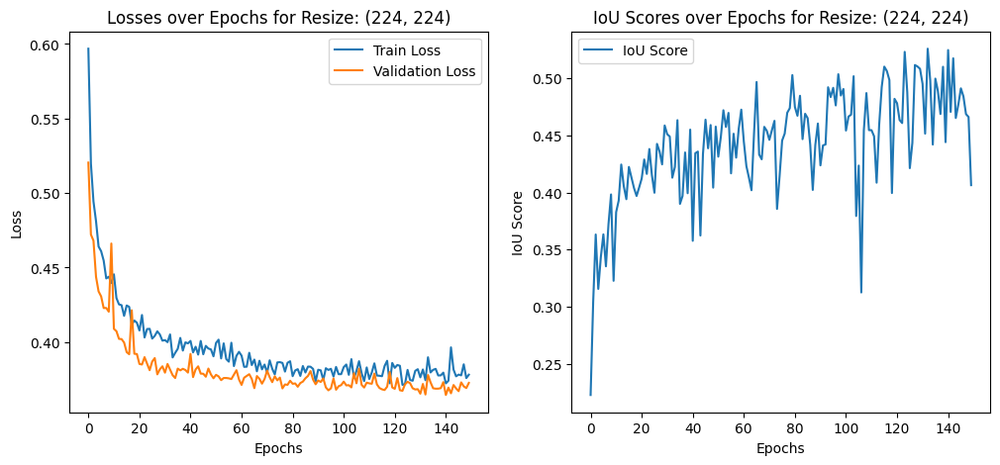

Training model with image size: (448, 448)


Epoch 1/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=2.17]


Epoch 1/150, Train Loss: 0.5541, Val Loss: 0.4859, Average IoU: 0.2112


Epoch 2/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.83]


Epoch 2/150, Train Loss: 0.4686, Val Loss: 0.4231, Average IoU: 0.2653


Epoch 3/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.78]


Epoch 3/150, Train Loss: 0.4540, Val Loss: 0.4168, Average IoU: 0.2528


Epoch 4/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.68]


Epoch 4/150, Train Loss: 0.4303, Val Loss: 0.4063, Average IoU: 0.3185


Epoch 5/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.7] 


Epoch 5/150, Train Loss: 0.4344, Val Loss: 0.3932, Average IoU: 0.3626


Epoch 6/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.65]


Epoch 6/150, Train Loss: 0.4217, Val Loss: 0.3943, Average IoU: 0.3489


Epoch 7/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.16s/it, loss=1.65]


Epoch 7/150, Train Loss: 0.4208, Val Loss: 0.3886, Average IoU: 0.3470


Epoch 8/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.17s/it, loss=1.61]


Epoch 8/150, Train Loss: 0.4120, Val Loss: 0.3878, Average IoU: 0.3275


Epoch 9/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.62]


Epoch 9/150, Train Loss: 0.4142, Val Loss: 0.3885, Average IoU: 0.3572


Epoch 10/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it, loss=1.65]


Epoch 10/150, Train Loss: 0.4206, Val Loss: 0.3854, Average IoU: 0.3785


Epoch 11/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.61]


Epoch 11/150, Train Loss: 0.4110, Val Loss: 0.3881, Average IoU: 0.2706


Epoch 12/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.59]


Epoch 12/150, Train Loss: 0.4060, Val Loss: 0.3891, Average IoU: 0.3126


Epoch 13/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.58]


Epoch 13/150, Train Loss: 0.4040, Val Loss: 0.3843, Average IoU: 0.3160


Epoch 14/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.58]


Epoch 14/150, Train Loss: 0.4037, Val Loss: 0.3826, Average IoU: 0.3500


Epoch 15/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.58]


Epoch 15/150, Train Loss: 0.4045, Val Loss: 0.3845, Average IoU: 0.3738


Epoch 16/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.16s/it, loss=1.56]


Epoch 16/150, Train Loss: 0.3994, Val Loss: 0.3840, Average IoU: 0.4060


Epoch 17/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.58]


Epoch 17/150, Train Loss: 0.4039, Val Loss: 0.3842, Average IoU: 0.3650


Epoch 18/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.57]


Epoch 18/150, Train Loss: 0.4020, Val Loss: 0.3810, Average IoU: 0.3612


Epoch 19/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.58]


Epoch 19/150, Train Loss: 0.4047, Val Loss: 0.3802, Average IoU: 0.3480


Epoch 20/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.55]


Epoch 20/150, Train Loss: 0.3970, Val Loss: 0.3813, Average IoU: 0.4283


Epoch 21/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.55]


Epoch 21/150, Train Loss: 0.3956, Val Loss: 0.3775, Average IoU: 0.4224


Epoch 22/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.55]


Epoch 22/150, Train Loss: 0.3961, Val Loss: 0.3773, Average IoU: 0.3730


Epoch 23/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.54]


Epoch 23/150, Train Loss: 0.3932, Val Loss: 0.3828, Average IoU: 0.3996


Epoch 24/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.57]


Epoch 24/150, Train Loss: 0.4007, Val Loss: 0.3914, Average IoU: 0.3995


Epoch 25/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.56]


Epoch 25/150, Train Loss: 0.3974, Val Loss: 0.3767, Average IoU: 0.4355


Epoch 26/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.56]


Epoch 26/150, Train Loss: 0.3981, Val Loss: 0.3783, Average IoU: 0.4280


Epoch 27/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.11s/it, loss=1.54]


Epoch 27/150, Train Loss: 0.3929, Val Loss: 0.3747, Average IoU: 0.4367


Epoch 28/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.55]


Epoch 28/150, Train Loss: 0.3956, Val Loss: 0.3781, Average IoU: 0.4136


Epoch 29/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.53]


Epoch 29/150, Train Loss: 0.3905, Val Loss: 0.3781, Average IoU: 0.4165


Epoch 30/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.52]


Epoch 30/150, Train Loss: 0.3885, Val Loss: 0.3795, Average IoU: 0.4464


Epoch 31/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.54]


Epoch 31/150, Train Loss: 0.3924, Val Loss: 0.3785, Average IoU: 0.3856


Epoch 32/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.54]


Epoch 32/150, Train Loss: 0.3937, Val Loss: 0.3762, Average IoU: 0.4161


Epoch 33/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.53]


Epoch 33/150, Train Loss: 0.3910, Val Loss: 0.3753, Average IoU: 0.4172


Epoch 34/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.54]


Epoch 34/150, Train Loss: 0.3925, Val Loss: 0.3779, Average IoU: 0.4196


Epoch 35/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.53]


Epoch 35/150, Train Loss: 0.3910, Val Loss: 0.3795, Average IoU: 0.3794


Epoch 36/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.54]


Epoch 36/150, Train Loss: 0.3928, Val Loss: 0.3780, Average IoU: 0.4188


Epoch 37/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.53]


Epoch 37/150, Train Loss: 0.3904, Val Loss: 0.3748, Average IoU: 0.4197


Epoch 38/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.51]


Epoch 38/150, Train Loss: 0.3863, Val Loss: 0.3817, Average IoU: 0.4465


Epoch 39/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.51]


Epoch 39/150, Train Loss: 0.3865, Val Loss: 0.3865, Average IoU: 0.4261


Epoch 40/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it, loss=1.51]


Epoch 40/150, Train Loss: 0.3868, Val Loss: 0.3772, Average IoU: 0.3832


Epoch 41/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.52]


Epoch 41/150, Train Loss: 0.3888, Val Loss: 0.3767, Average IoU: 0.4635


Epoch 42/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.51]


Epoch 42/150, Train Loss: 0.3854, Val Loss: 0.3734, Average IoU: 0.4364


Epoch 43/150 Training: 100%|██████████| 35/35 [00:36<00:00,  1.05s/it, loss=1.52]


Epoch 43/150, Train Loss: 0.3875, Val Loss: 0.3762, Average IoU: 0.4184


Epoch 44/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.52]


Epoch 44/150, Train Loss: 0.3872, Val Loss: 0.3789, Average IoU: 0.3936


Epoch 45/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.52]


Epoch 45/150, Train Loss: 0.3873, Val Loss: 0.3732, Average IoU: 0.4289


Epoch 46/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.49]


Epoch 46/150, Train Loss: 0.3816, Val Loss: 0.3745, Average IoU: 0.4034


Epoch 47/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.51]


Epoch 47/150, Train Loss: 0.3857, Val Loss: 0.3753, Average IoU: 0.4489


Epoch 48/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.51]


Epoch 48/150, Train Loss: 0.3846, Val Loss: 0.3772, Average IoU: 0.4070


Epoch 49/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.52]


Epoch 49/150, Train Loss: 0.3894, Val Loss: 0.3742, Average IoU: 0.4363


Epoch 50/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.17s/it, loss=1.52]


Epoch 50/150, Train Loss: 0.3879, Val Loss: 0.3724, Average IoU: 0.4521


Epoch 51/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.5] 


Epoch 51/150, Train Loss: 0.3835, Val Loss: 0.3750, Average IoU: 0.4342


Epoch 52/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.11s/it, loss=1.51]


Epoch 52/150, Train Loss: 0.3852, Val Loss: 0.3739, Average IoU: 0.4239


Epoch 53/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.5] 


Epoch 53/150, Train Loss: 0.3822, Val Loss: 0.3739, Average IoU: 0.4420


Epoch 54/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.52]


Epoch 54/150, Train Loss: 0.3883, Val Loss: 0.3768, Average IoU: 0.4232


Epoch 55/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.5] 


Epoch 55/150, Train Loss: 0.3832, Val Loss: 0.3825, Average IoU: 0.4277


Epoch 56/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.11s/it, loss=1.51]


Epoch 56/150, Train Loss: 0.3859, Val Loss: 0.3708, Average IoU: 0.4555


Epoch 57/150 Training: 100%|██████████| 35/35 [00:36<00:00,  1.06s/it, loss=1.49]


Epoch 57/150, Train Loss: 0.3796, Val Loss: 0.3743, Average IoU: 0.4387


Epoch 58/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.5] 


Epoch 58/150, Train Loss: 0.3823, Val Loss: 0.3743, Average IoU: 0.4526


Epoch 59/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.5] 


Epoch 59/150, Train Loss: 0.3842, Val Loss: 0.3718, Average IoU: 0.4478


Epoch 60/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.5] 


Epoch 60/150, Train Loss: 0.3835, Val Loss: 0.3715, Average IoU: 0.4639


Epoch 61/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.51]


Epoch 61/150, Train Loss: 0.3859, Val Loss: 0.3762, Average IoU: 0.4452


Epoch 62/150 Training: 100%|██████████| 35/35 [00:36<00:00,  1.06s/it, loss=1.51]


Epoch 62/150, Train Loss: 0.3867, Val Loss: 0.3751, Average IoU: 0.4190


Epoch 63/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.48]


Epoch 63/150, Train Loss: 0.3788, Val Loss: 0.3709, Average IoU: 0.4667


Epoch 64/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.49]


Epoch 64/150, Train Loss: 0.3810, Val Loss: 0.3751, Average IoU: 0.4325


Epoch 65/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.49]


Epoch 65/150, Train Loss: 0.3796, Val Loss: 0.3745, Average IoU: 0.4206


Epoch 66/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.5] 


Epoch 66/150, Train Loss: 0.3824, Val Loss: 0.3705, Average IoU: 0.4649


Epoch 67/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.48]


Epoch 67/150, Train Loss: 0.3770, Val Loss: 0.3716, Average IoU: 0.4770


Epoch 68/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.5] 


Epoch 68/150, Train Loss: 0.3827, Val Loss: 0.3741, Average IoU: 0.4429


Epoch 69/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.5] 


Epoch 69/150, Train Loss: 0.3823, Val Loss: 0.3712, Average IoU: 0.4640


Epoch 70/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.5] 


Epoch 70/150, Train Loss: 0.3830, Val Loss: 0.3706, Average IoU: 0.4919


Epoch 71/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.5] 


Epoch 71/150, Train Loss: 0.3823, Val Loss: 0.3759, Average IoU: 0.4204


Epoch 72/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.5] 


Epoch 72/150, Train Loss: 0.3820, Val Loss: 0.3712, Average IoU: 0.4938


Epoch 73/150 Training: 100%|██████████| 35/35 [00:35<00:00,  1.00s/it, loss=1.5] 


Epoch 73/150, Train Loss: 0.3820, Val Loss: 0.3708, Average IoU: 0.4617


Epoch 74/150 Training: 100%|██████████| 35/35 [00:33<00:00,  1.05it/s, loss=1.49]


Epoch 74/150, Train Loss: 0.3807, Val Loss: 0.3704, Average IoU: 0.4492


Epoch 75/150 Training: 100%|██████████| 35/35 [00:34<00:00,  1.00it/s, loss=1.49]


Epoch 75/150, Train Loss: 0.3816, Val Loss: 0.3793, Average IoU: 0.3958


Epoch 76/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.5] 


Epoch 76/150, Train Loss: 0.3836, Val Loss: 0.3681, Average IoU: 0.4723


Epoch 77/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.49]


Epoch 77/150, Train Loss: 0.3813, Val Loss: 0.3734, Average IoU: 0.4576


Epoch 78/150 Training: 100%|██████████| 35/35 [00:36<00:00,  1.06s/it, loss=1.49]


Epoch 78/150, Train Loss: 0.3802, Val Loss: 0.3682, Average IoU: 0.4890


Epoch 79/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.49]


Epoch 79/150, Train Loss: 0.3798, Val Loss: 0.3708, Average IoU: 0.4662


Epoch 80/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.48]


Epoch 80/150, Train Loss: 0.3793, Val Loss: 0.3709, Average IoU: 0.4730


Epoch 81/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.46]


Epoch 81/150, Train Loss: 0.3741, Val Loss: 0.3733, Average IoU: 0.4497


Epoch 82/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.47]


Epoch 82/150, Train Loss: 0.3743, Val Loss: 0.3690, Average IoU: 0.4915


Epoch 83/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.47]


Epoch 83/150, Train Loss: 0.3759, Val Loss: 0.3673, Average IoU: 0.4731


Epoch 84/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.48]


Epoch 84/150, Train Loss: 0.3786, Val Loss: 0.3693, Average IoU: 0.4611


Epoch 85/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it, loss=1.47]


Epoch 85/150, Train Loss: 0.3767, Val Loss: 0.3677, Average IoU: 0.4777


Epoch 86/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.47]


Epoch 86/150, Train Loss: 0.3755, Val Loss: 0.3729, Average IoU: 0.4860


Epoch 87/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it, loss=1.5] 


Epoch 87/150, Train Loss: 0.3820, Val Loss: 0.3702, Average IoU: 0.4575


Epoch 88/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.07s/it, loss=1.48]


Epoch 88/150, Train Loss: 0.3770, Val Loss: 0.3672, Average IoU: 0.4857


Epoch 89/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.08s/it, loss=1.46]


Epoch 89/150, Train Loss: 0.3741, Val Loss: 0.3719, Average IoU: 0.4445


Epoch 90/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.48]


Epoch 90/150, Train Loss: 0.3772, Val Loss: 0.3703, Average IoU: 0.5123


Epoch 91/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.49]


Epoch 91/150, Train Loss: 0.3798, Val Loss: 0.3736, Average IoU: 0.5167


Epoch 92/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.47]


Epoch 92/150, Train Loss: 0.3751, Val Loss: 0.3699, Average IoU: 0.4909


Epoch 93/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.47]


Epoch 93/150, Train Loss: 0.3748, Val Loss: 0.3709, Average IoU: 0.4565


Epoch 94/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.48]


Epoch 94/150, Train Loss: 0.3773, Val Loss: 0.3746, Average IoU: 0.3968


Epoch 95/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.48]


Epoch 95/150, Train Loss: 0.3779, Val Loss: 0.3709, Average IoU: 0.4618


Epoch 96/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.47]


Epoch 96/150, Train Loss: 0.3768, Val Loss: 0.3707, Average IoU: 0.4745


Epoch 97/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.48]


Epoch 97/150, Train Loss: 0.3786, Val Loss: 0.3662, Average IoU: 0.5020


Epoch 98/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.48]


Epoch 98/150, Train Loss: 0.3776, Val Loss: 0.3678, Average IoU: 0.4929


Epoch 99/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.09s/it, loss=1.47]


Epoch 99/150, Train Loss: 0.3747, Val Loss: 0.3687, Average IoU: 0.4797


Epoch 100/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.46]


Epoch 100/150, Train Loss: 0.3727, Val Loss: 0.3707, Average IoU: 0.4865


Epoch 101/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.46]


Epoch 101/150, Train Loss: 0.3730, Val Loss: 0.3682, Average IoU: 0.5017


Epoch 102/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.47]


Epoch 102/150, Train Loss: 0.3756, Val Loss: 0.3697, Average IoU: 0.4526


Epoch 103/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.47]


Epoch 103/150, Train Loss: 0.3756, Val Loss: 0.3701, Average IoU: 0.4657


Epoch 104/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.49]


Epoch 104/150, Train Loss: 0.3803, Val Loss: 0.3714, Average IoU: 0.5003


Epoch 105/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.45]


Epoch 105/150, Train Loss: 0.3707, Val Loss: 0.3697, Average IoU: 0.4835


Epoch 106/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.46]


Epoch 106/150, Train Loss: 0.3741, Val Loss: 0.3651, Average IoU: 0.5206


Epoch 107/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.49]


Epoch 107/150, Train Loss: 0.3797, Val Loss: 0.3703, Average IoU: 0.4566


Epoch 108/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.46]


Epoch 108/150, Train Loss: 0.3728, Val Loss: 0.3664, Average IoU: 0.5191


Epoch 109/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.49]


Epoch 109/150, Train Loss: 0.3802, Val Loss: 0.3692, Average IoU: 0.4647


Epoch 110/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.47]


Epoch 110/150, Train Loss: 0.3747, Val Loss: 0.3709, Average IoU: 0.4494


Epoch 111/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.45]


Epoch 111/150, Train Loss: 0.3717, Val Loss: 0.3689, Average IoU: 0.4898


Epoch 112/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.45]


Epoch 112/150, Train Loss: 0.3697, Val Loss: 0.3689, Average IoU: 0.5111


Epoch 113/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.44]


Epoch 113/150, Train Loss: 0.3683, Val Loss: 0.3686, Average IoU: 0.4850


Epoch 114/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.49]


Epoch 114/150, Train Loss: 0.3804, Val Loss: 0.3668, Average IoU: 0.5362
Model saved to saved_models\model_cropped_448x448.pth


Epoch 115/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.47]


Epoch 115/150, Train Loss: 0.3750, Val Loss: 0.3683, Average IoU: 0.4752


Epoch 116/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.45]


Epoch 116/150, Train Loss: 0.3714, Val Loss: 0.3674, Average IoU: 0.4874


Epoch 117/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.11s/it, loss=1.46]


Epoch 117/150, Train Loss: 0.3729, Val Loss: 0.3684, Average IoU: 0.5020


Epoch 118/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.47]


Epoch 118/150, Train Loss: 0.3752, Val Loss: 0.3670, Average IoU: 0.5188


Epoch 119/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.46]


Epoch 119/150, Train Loss: 0.3718, Val Loss: 0.3681, Average IoU: 0.4822


Epoch 120/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.46]


Epoch 120/150, Train Loss: 0.3725, Val Loss: 0.3680, Average IoU: 0.4721


Epoch 121/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.46]


Epoch 121/150, Train Loss: 0.3733, Val Loss: 0.3678, Average IoU: 0.4621


Epoch 122/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.44]


Epoch 122/150, Train Loss: 0.3679, Val Loss: 0.3663, Average IoU: 0.4900


Epoch 123/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.45]


Epoch 123/150, Train Loss: 0.3697, Val Loss: 0.3688, Average IoU: 0.5030


Epoch 124/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.44]


Epoch 124/150, Train Loss: 0.3686, Val Loss: 0.3713, Average IoU: 0.4575


Epoch 125/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.46]


Epoch 125/150, Train Loss: 0.3725, Val Loss: 0.3703, Average IoU: 0.5087


Epoch 126/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.15s/it, loss=1.46]


Epoch 126/150, Train Loss: 0.3724, Val Loss: 0.3651, Average IoU: 0.5195


Epoch 127/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.45]


Epoch 127/150, Train Loss: 0.3702, Val Loss: 0.3671, Average IoU: 0.5123


Epoch 128/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.47]


Epoch 128/150, Train Loss: 0.3756, Val Loss: 0.3655, Average IoU: 0.5273


Epoch 129/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.45]


Epoch 129/150, Train Loss: 0.3705, Val Loss: 0.3891, Average IoU: 0.4920


Epoch 130/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.45]


Epoch 130/150, Train Loss: 0.3705, Val Loss: 0.3666, Average IoU: 0.5154


Epoch 131/150 Training: 100%|██████████| 35/35 [00:40<00:00,  1.14s/it, loss=1.44]


Epoch 131/150, Train Loss: 0.3681, Val Loss: 0.3666, Average IoU: 0.4790


Epoch 132/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.47]


Epoch 132/150, Train Loss: 0.3745, Val Loss: 0.3673, Average IoU: 0.4956


Epoch 133/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.45]


Epoch 133/150, Train Loss: 0.3717, Val Loss: 0.3705, Average IoU: 0.4576


Epoch 134/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.11s/it, loss=1.45]


Epoch 134/150, Train Loss: 0.3693, Val Loss: 0.3686, Average IoU: 0.5068


Epoch 135/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.46]


Epoch 135/150, Train Loss: 0.3741, Val Loss: 0.3698, Average IoU: 0.4700


Epoch 136/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.45]


Epoch 136/150, Train Loss: 0.3697, Val Loss: 0.3662, Average IoU: 0.5083


Epoch 137/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.47]


Epoch 137/150, Train Loss: 0.3743, Val Loss: 0.3719, Average IoU: 0.4652


Epoch 138/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.46]


Epoch 138/150, Train Loss: 0.3735, Val Loss: 0.3728, Average IoU: 0.4346


Epoch 139/150 Training: 100%|██████████| 35/35 [00:37<00:00,  1.06s/it, loss=1.44]


Epoch 139/150, Train Loss: 0.3676, Val Loss: 0.3645, Average IoU: 0.5244


Epoch 140/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.45]


Epoch 140/150, Train Loss: 0.3706, Val Loss: 0.3638, Average IoU: 0.5223


Epoch 141/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.46]


Epoch 141/150, Train Loss: 0.3718, Val Loss: 0.3675, Average IoU: 0.4871


Epoch 142/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.45]


Epoch 142/150, Train Loss: 0.3711, Val Loss: 0.3663, Average IoU: 0.5109


Epoch 143/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.45]


Epoch 143/150, Train Loss: 0.3712, Val Loss: 0.3631, Average IoU: 0.5481
Model saved to saved_models\model_cropped_448x448.pth


Epoch 144/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.44]


Epoch 144/150, Train Loss: 0.3688, Val Loss: 0.3662, Average IoU: 0.5053


Epoch 145/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.10s/it, loss=1.44]


Epoch 145/150, Train Loss: 0.3685, Val Loss: 0.3672, Average IoU: 0.5321


Epoch 146/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.13s/it, loss=1.44]


Epoch 146/150, Train Loss: 0.3682, Val Loss: 0.3665, Average IoU: 0.5426


Epoch 147/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.14s/it, loss=1.45]


Epoch 147/150, Train Loss: 0.3704, Val Loss: 0.3657, Average IoU: 0.5068


Epoch 148/150 Training: 100%|██████████| 35/35 [00:39<00:00,  1.12s/it, loss=1.46]


Epoch 148/150, Train Loss: 0.3736, Val Loss: 0.3664, Average IoU: 0.5167


Epoch 149/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.11s/it, loss=1.47]


Epoch 149/150, Train Loss: 0.3747, Val Loss: 0.3634, Average IoU: 0.5422


Epoch 150/150 Training: 100%|██████████| 35/35 [00:38<00:00,  1.09s/it, loss=1.46]


Epoch 150/150, Train Loss: 0.3722, Val Loss: 0.3650, Average IoU: 0.5279


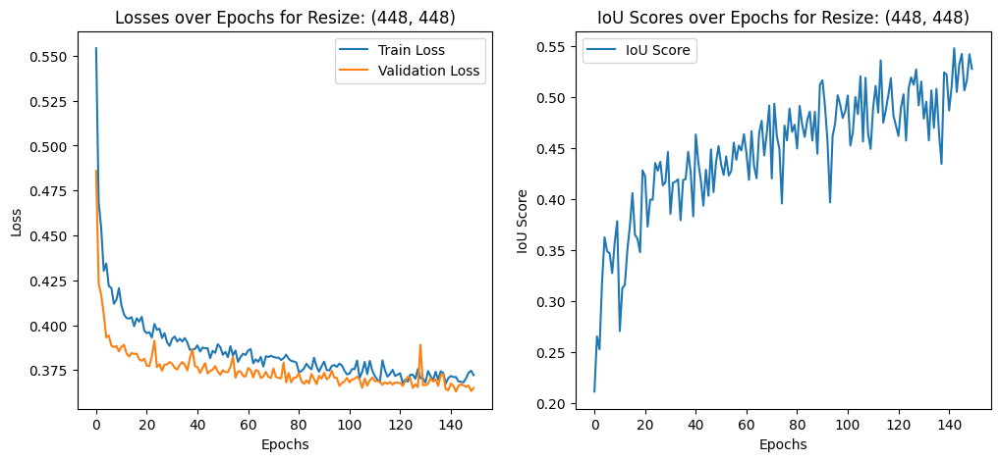

In [37]:
sizes = [(224, 224), (448, 448)]
num_epochs = 150
# Suponiendo que estás ejecutando esto desde el directorio principal de tu proyecto
base_path = os.getcwd()  # Obtener la ruta del directorio actual donde se ejecuta el script
base_path = os.path.join(base_path, 'images')  # Añadir subdirectorio 'images' a la ruta base

best_loss = 0  # Inicialización de la mejor pérdida como cero para comparaciones futuras

torch.cuda.empty_cache()  # Limpiar la caché de CUDA para liberar memoria del GPU

for resize in sizes:
    print(f"Training model with image size: {resize}")  # Informar sobre el tamaño de imagen con el que se va a entrenar
    train_loader, val_loader = create_dataloaders_onehot(base_path, resize[0])  # Crear DataLoader para entrenamiento y validación

    # Reajustar listas de pérdidas e IoU para cada tamaño
    train_losses = []
    val_losses = []
    iou_scores = []

    for epoch in range(num_epochs):  # Bucle sobre cada época
        model.train()  # Poner el modelo en modo entrenamiento
        running_loss = 0.0
        train_tqdm = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} Training', leave=True)  # Usar tqdm para la barra de progreso
        for images, masks in train_tqdm:
            images, masks = images.to(device), masks.to(device)  # Mover imágenes y máscaras al dispositivo (GPU o CPU)
            
            optimizer.zero_grad()  # Resetear los gradientes del optimizador
            outputs = model(images)  # Obtener las salidas del modelo
            loss = criterion(outputs, masks)  # Calcular la pérdida
            loss.backward()  # Retropropagación de la pérdida
            optimizer.step()  # Actualizar los pesos del modelo
            
            running_loss += loss.item() * images.size(0)  # Acumular la pérdida ajustada por el tamaño del batch
            train_tqdm.set_postfix(loss=(running_loss / (train_tqdm.last_print_n + 1)))  # Mostrar la pérdida promedio en tqdm
        
        epoch_loss = running_loss / len(train_loader.dataset)  # Calcular la pérdida promedio de la época
        train_losses.append(epoch_loss)  # Guardar la pérdida de entrenamiento

        val_loss, average_iou = validate_model(val_loader, model, output_size=1344, device=device, criterion=criterion)  # Validar el modelo
        val_losses.append(val_loss)  # Guardar la pérdida de validación
        iou_scores.append(average_iou)  # Guardar el IoU promedio
        
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, Average IoU: {iou_scores[-1]:.4f}')

        if average_iou > best_loss:  # Guardar el modelo si el IoU promedio es el mejor hasta ahora
            model_save_path = os.path.join('saved_models', f'model_cropped_{resize[0]}x{resize[1]}.pth')
            os.makedirs('saved_models', exist_ok=True)  # Crear el directorio si no existe
            torch.save(model.state_dict(), model_save_path)
            print(f"Model saved to {model_save_path}")
            best_loss = average_iou

    # Opcionalmente, graficar los resultados para cada tamaño
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title(f'Losses over Epochs for Resize: {resize}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(iou_scores, label='IoU Score')
    plt.title(f'IoU Scores over Epochs for Resize: {resize}')
    plt.xlabel('Epochs')
    plt.ylabel('IoU Score')
    plt.legend()
    plt.show()

    model.apply(weight_reset)  # Reiniciar los pesos del modelo para evitar el efecto de entrenamiento residual en la próxima iteración


In [38]:
def create_test_dataloader(base_path, batch_size, resize):
    """
    Crea un DataLoader para el conjunto de datos de prueba con transformaciones específicas para imágenes y máscaras.
    
    Args:
        base_path (str): Ruta base donde están almacenados los directorios de imágenes y máscaras.
        batch_size (int): Número de muestras por cada lote.
        resize (int): Tamaño al que se redimensionarán las imágenes y las máscaras.
    
    Returns:
        DataLoader: Objeto DataLoader configurado para el conjunto de datos de prueba.
    """
    # Transformaciones para las imágenes
    transform_image = transforms.Compose([
        transforms.Resize(1344),  # Redimensionar las imágenes a un tamaño fijo
        transforms.ToTensor(),  # Convertir las imágenes a tensores
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalizar las imágenes
    ])
    
    # Transformaciones para las máscaras, incluyendo conversión a formato one-hot
    transform_mask = transforms.Compose([
        transforms.Resize(1344),  # Redimensionar las máscaras al mismo tamaño que las imágenes
        ToOneHot(),  # Convertir las máscaras a formato one-hot
        # Nota: La conversión a Tensor se maneja internamente por ToOneHot si es necesario
    ])
    
    # Directorios donde se encuentran las imágenes y máscaras de prueba
    test_dir = os.path.join(base_path, 'test')
    test_mask_dir = os.path.join(base_path, 'test_labels')
    # Crear un conjunto de datos utilizando las transformaciones definidas
    test_dataset = SatelliteBuildingDataset(test_dir, test_mask_dir, transform_image, transform_mask)
    # Crear el DataLoader con los datos de prueba
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return test_loader


def test_and_plot_model(val_loader, model, output_size, device, num_examples=1):
    """
    Evalúa el modelo y visualiza los resultados para un conjunto limitado de ejemplos del DataLoader de validación.
    
    Args:
        val_loader (DataLoader): DataLoader que proporciona los datos de prueba o validación.
        model (torch.nn.Module): Modelo de red neuronal a evaluar.
        output_size (int): Tamaño de salida deseado para los segmentos de las imágenes.
        device (torch.device): Dispositivo en el que se ejecuta el modelo (CPU o GPU).
        num_examples (int): Número de ejemplos a visualizar.
    """
    model.eval()  # Poner el modelo en modo evaluación
    for batch_idx, (images, masks) in enumerate(val_loader):
        if batch_idx >= num_examples:
            break
        images = images.to(device)
        masks = masks.to(device)
        predictions = torch.zeros_like(masks)  # Preparar tensor para almacenar las predicciones

        for i, (image, mask) in enumerate(zip(images, masks)):
            segments, coords = split_image_into_segments(image.cpu(), output_size)
            full_mask = predict_and_recombine_segments(segments, coords, model, output_size, image.shape, device)
            predictions[i] = full_mask.to(device)
        
            # Convertir máscaras one-hot a un canal para la visualización
            mask_single_channel = torch.argmax(mask, dim=0).cpu()
            full_mask_single_channel = torch.argmax(full_mask, dim=0).cpu()
        
            # Configurar los plots para mostrar la imagen original, la máscara original y la máscara predicha
            plt.figure(figsize=(15, 5))
            plt.subplot(1, 3, 1)
            plt.imshow(image.cpu().permute(1, 2, 0))
            plt.title("Original Image")
            plt.axis("off")
        
            plt.subplot(1, 3, 2)
            plt.imshow(mask_single_channel, cmap="gray")
            plt.title("Original Mask")
            plt.axis("off")
        
            plt.subplot(1, 3, 3)
            plt.imshow(full_mask_single_channel, cmap="gray")
            plt.title("Predicted Full Mask")
            plt.axis("off")
            plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


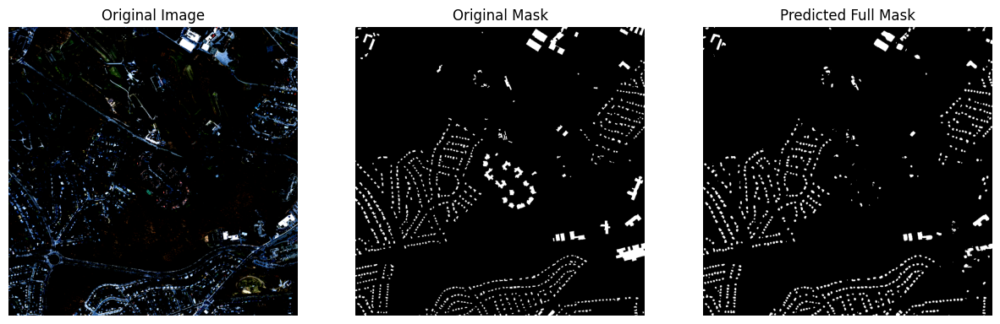

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


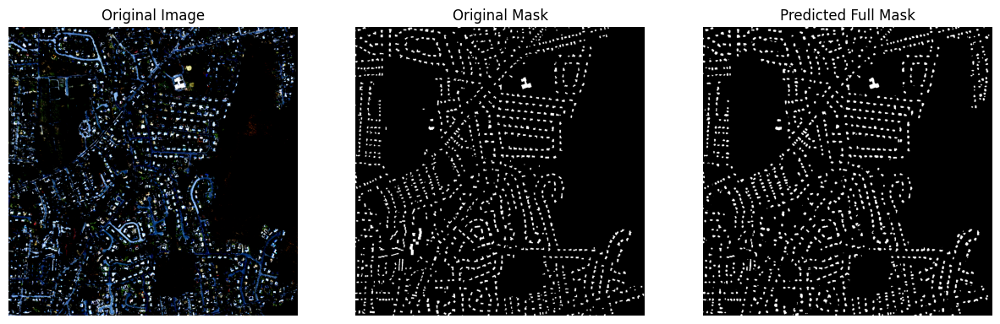

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


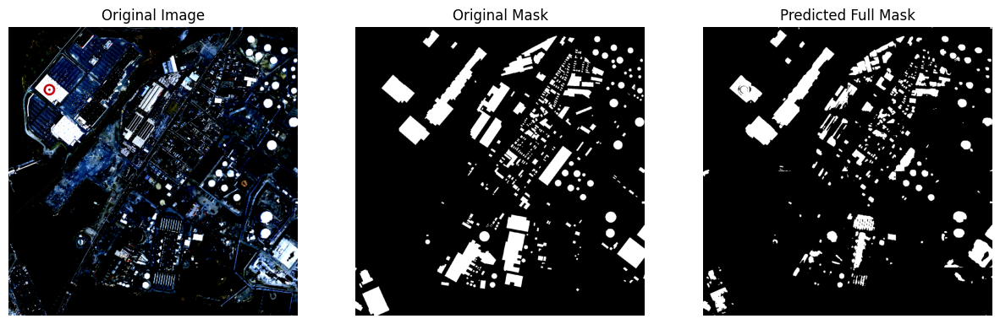

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


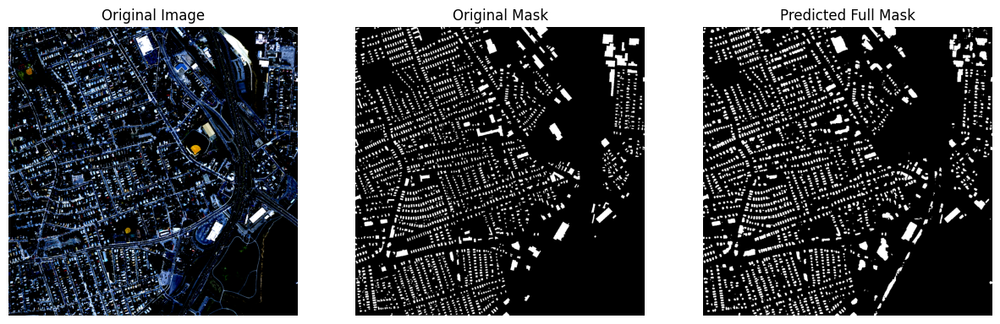

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


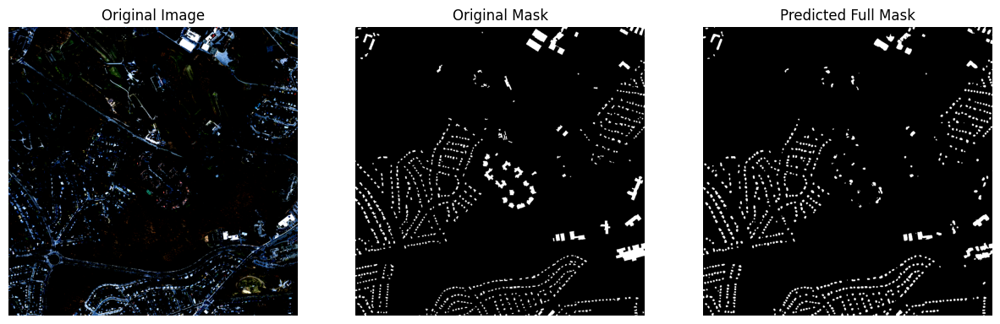

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


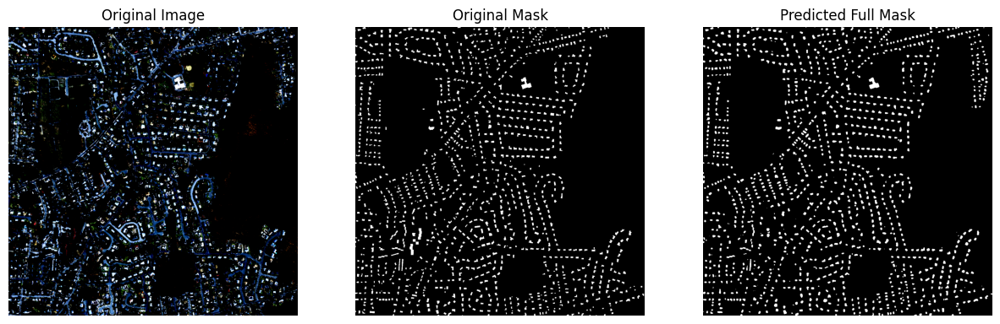

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


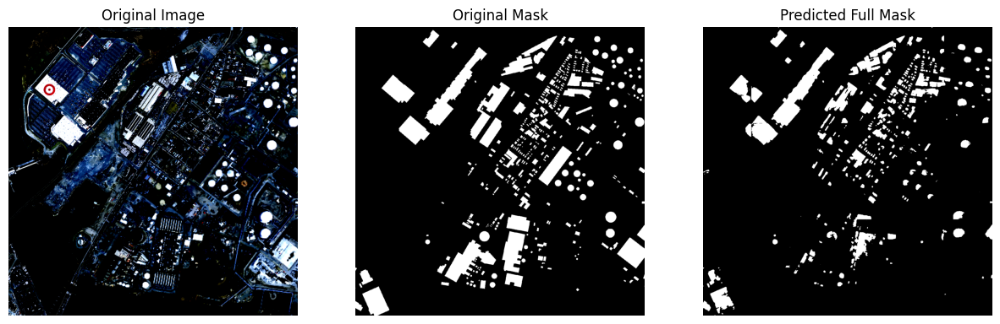

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


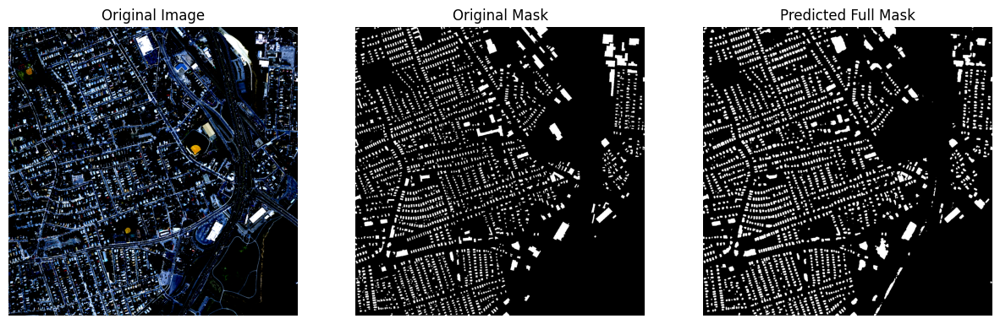

In [39]:
batch_size = 1  # Tamaño del lote establecido a 1, útil para evaluaciones detalladas o donde se necesite procesamiento individual

# Bucle sobre diferentes tamaños de imagen para probar el modelo con cada configuración de tamaño
for resize in sizes:
    model_path = f'saved_models/model_cropped_{resize[0]}x{resize[1]}.pth'  # Ruta al modelo guardado
    test_loader = create_test_dataloader(base_path, batch_size, resize)  # Crear DataLoader para el conjunto de prueba

    model = UNet()  # Creación de la instancia del modelo, asumiendo que es una U-Net
    model.load_state_dict(torch.load(model_path))  # Cargar los pesos del modelo desde el archivo guardado
    model.to(device)  # Mover el modelo al dispositivo adecuado (GPU o CPU)

    # Ejecutar la función que prueba el modelo y visualiza los resultados
    # Nota: Asegúrate de que 'output_size' esté definido correctamente aquí para que coincida con la lógica de 'test_and_plot_model'
    test_and_plot_model(test_loader, model, output_size, device, num_examples=5)

### Los resultados con este método son bastante mejores, aumentando x5 el resultado original en cuanto al IoU. Para seguir mejorando el modelo, creo que se podría modificar el modelo para usar algún tipo de modelo preentrenado para constituir la red U-Net.